## 서울시 공공자전거 대여소 정보 분석과 시각화

데이터 출처 : [서울시 공공자전거 대여소 정보> 데이터셋> 공공데이터 | 서울열린데이터광장](http://data.seoul.go.kr/dataList/OA-13252/F/1/datasetView.do)



* keyword
    * seaborn - barplot, boxplot, violinplot
    * **seaborn PairGrid vs matplotlib - subplots**
    * seaborn FacetGrid
        * **catplot 범주형 데이터 시각화 (kind: count, bar, box, boxen, violin)**
        * relplot 연속된 수치 데이터 시각화 (kind: scatter, line)
    * pandas - value_counts, cross_tab, groupby, pivot_table
  
<img src="https://seaborn.pydata.org/_images/function_overview_8_0.png">

* seaborn 에 대해 좀 더 알고 싶다면 다음의 튜토리얼을 참고해 보세요.
* [User guide and tutorial — seaborn documentation](https://seaborn.pydata.org/tutorial.html)

In [1]:
# pandas, numpy, seaborn, matplotlib.pyplot 불러오기
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## 시각화를 위한 한글폰트 설정

In [2]:
def get_font_family():
    """
    시스템 환경에 따른 기본 폰트명을 반환하는 함수
    """
    import platform
    system_name = platform.system()

    if system_name == "Darwin" :
        font_family = "AppleGothic"
    elif system_name == "Windows":
        font_family = "Malgun Gothic"
    else:
        # Linux(colab)
        !apt-get install fonts-nanum -qq  > /dev/null
        !fc-cache -fv

        import matplotlib as mpl
        mpl.font_manager._rebuild()
        findfont = mpl.font_manager.fontManager.findfont
        mpl.font_manager.findfont = findfont
        mpl.backends.backend_agg.findfont = findfont
        
        font_family = "NanumBarunGothic"
    return font_family


# style 설정은 꼭 폰트설정 위에서 합니다.
# style 에 폰트 설정이 들어있으면 한글폰트가 초기화 되어 한글이 깨집니다.
plt.style.use("seaborn")
# 폰트설정
plt.rc("font", family=get_font_family())

# 마이너스폰트 설정
plt.rc("axes", unicode_minus=False)

# 그래프에 retina display 적용
%config InlineBackend.figure_format = 'retina'

<AxesSubplot:title={'center':'한글'}>

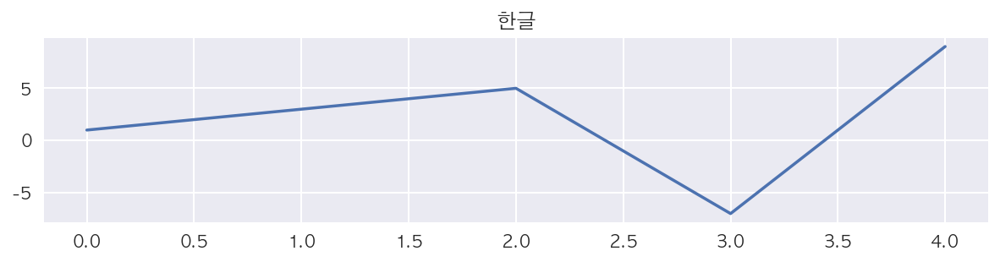

In [3]:
pd.Series([1, 3, 5, -7, 9]).plot(title="한글", figsize=(10, 2))

## 데이터 불러오기

In [4]:
# data/bike_station.csv 파일 불러오기
file_name = "data/bike_station.csv"

import glob
glob.glob(file_name)

['data/bike_station.csv']

In [5]:
df = pd.read_csv(file_name)
df.shape

(2586, 15)

In [6]:
df.head()

,대여소번호,대여소명,자치구,상세주소,위도,경도,설치시기,LCD,QR,운영방식,자전거수,연도,월,일,요일
0,102.0,망원역 1번출구 앞,마포구,서울특별시 마포구 월드컵로 72,37.555649,126.910629,2015-09-06 23:42:06.000,20.0,NaN,LCD,20,2015,9,6,6
1,103.0,망원역 2번출구 앞,마포구,서울특별시 마포구 월드컵로 79,37.554951,126.910835,2015-09-06 23:43:13.000,14.0,NaN,LCD,14,2015,9,6,6
2,104.0,합정역 1번출구 앞,마포구,서울특별시 마포구 양화로 59,37.550629,126.914986,2015-09-06 23:44:31.000,13.0,NaN,LCD,13,2015,9,6,6
3,105.0,합정역 5번출구 앞,마포구,서울특별시 마포구 양화로 48,37.550007,126.914825,2015-09-06 23:45:30.000,5.0,NaN,LCD,5,2015,9,6,6
4,106.0,합정역 7번출구 앞,마포구,서울특별시 마포구 독막로 4,37.548645,126.912827,2015-09-06 23:46:31.000,10.0,NaN,LCD,10,2015,9,6,6


In [7]:
df.tail()

,대여소번호,대여소명,자치구,상세주소,위도,경도,설치시기,LCD,QR,운영방식,자전거수,연도,월,일,요일
2581,5070.0,마곡13단지힐스테이트마스터 후문(1320동 앞),강서구,서울시 강서구 마곡중앙1로 71 마곡13단지힐스테이트마스터 후문 인근,37.556763,126.818695,2021-11-11 00:00:00.000,NaN,15.0,QR,15,2021,11,11,3
2582,5072.0,김포공항입구 교통섬,강서구,공항동 74-5,37.561546,126.807083,2021-09-28 00:00:00.000,NaN,10.0,QR,10,2021,9,28,1
2583,5073.0,우장산역 헤링턴타워 앞,강서구,화곡동 1013-3,37.546619,126.836235,2021-10-20 00:00:00.000,NaN,6.0,QR,6,2021,10,20,2
2584,5074.0,마곡동 주니어마곡점앞,강서구,강서구 마곡동 798-17,37.558235,126.825760,2021-11-19 00:00:00.000,NaN,10.0,QR,10,2021,11,19,4
2585,5075.0,템퍼 목동점,강서구,강서구 등촌동 649-14,37.551884,126.863571,2021-11-19 00:00:00.000,NaN,10.0,QR,10,2021,11,19,4


## 데이터 요약

In [8]:
# info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2586 entries, 0 to 2585
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   대여소번호   2586 non-null   float64
 1   대여소명    2586 non-null   object 
 2   자치구     2586 non-null   object 
 3   상세주소    2586 non-null   object 
 4   위도      2586 non-null   float64
 5   경도      2586 non-null   float64
 6   설치시기    2586 non-null   object 
 7   LCD     1400 non-null   float64
 8   QR      1187 non-null   float64
 9   운영방식    2586 non-null   object 
 10  자전거수    2586 non-null   int64  
 11  연도      2586 non-null   int64  
 12  월       2586 non-null   int64  
 13  일       2586 non-null   int64  
 14  요일      2586 non-null   int64  
dtypes: float64(5), int64(5), object(5)
memory usage: 303.2+ KB


## 중복확인

In [9]:
# duplicated
df[df.duplicated()]

,대여소번호,대여소명,자치구,상세주소,위도,경도,설치시기,LCD,QR,운영방식,자전거수,연도,월,일,요일


## 결측치 확인
### 결측치 합계

In [10]:
df.isnull().sum()

대여소번호       0
대여소명        0
자치구         0
상세주소        0
위도          0
경도          0
설치시기        0
LCD      1186
QR       1399
운영방식        0
자전거수        0
연도          0
월           0
일           0
요일          0
dtype: int64

### 결측치 비율

In [11]:
df.isnull().mean() * 100

대여소번호     0.000000
대여소명      0.000000
자치구       0.000000
상세주소      0.000000
위도        0.000000
경도        0.000000
설치시기      0.000000
LCD      45.862336
QR       54.098995
운영방식      0.000000
자전거수      0.000000
연도        0.000000
월         0.000000
일         0.000000
요일        0.000000
dtype: float64

### 결측치 시각화

<AxesSubplot:>

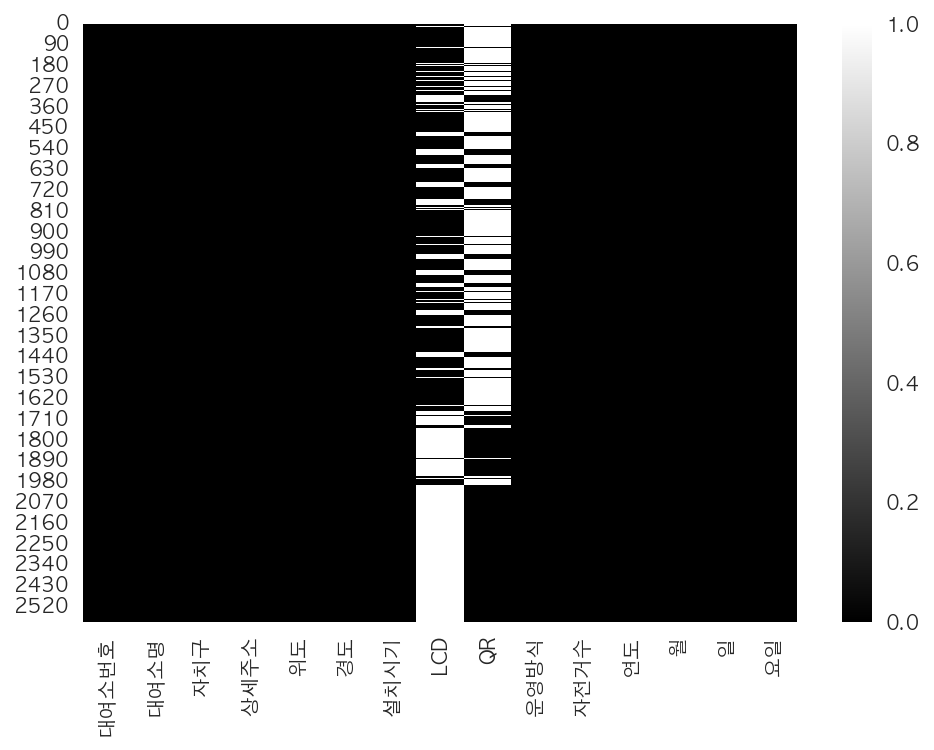

In [12]:
sns.heatmap(df.isnull(), cmap="gray")

## 기초 기술통계 

In [13]:
# 수치 데이터 기술통계
df.describe()

,대여소번호,위도,경도,LCD,QR,자전거수,연도,월,일,요일
count,2586.000000,2586.000000,2586.000000,1400.000000,1187.000000,2586.000000,2586.000000,2586.000000,2586.000000,2586.000000
mean,2110.668987,37.547230,126.991710,12.666429,11.679865,12.218484,2018.495360,6.651585,15.362336,2.016628
std,1420.431320,0.051938,0.092821,4.728000,4.776484,4.777751,1.894351,3.344621,9.642257,1.447506
min,102.000000,37.430977,126.798599,5.000000,4.000000,4.000000,2015.000000,1.000000,1.000000,0.000000
25%,923.250000,37.505417,126.914808,10.000000,10.000000,10.000000,2017.000000,4.000000,7.000000,1.000000
50%,1845.500000,37.546198,127.002693,10.000000,10.000000,10.000000,2018.000000,6.000000,15.000000,2.000000
75%,3412.750000,37.577216,127.064451,15.000000,15.000000,15.000000,2020.000000,10.000000,24.000000,3.000000
max,5075.000000,37.691013,127.180641,40.000000,40.000000,40.000000,2021.000000,12.000000,31.000000,6.000000


In [14]:
# 범주 데이터 기술통계
df.describe(include="object")

,대여소명,자치구,상세주소,설치시기,운영방식
count,2586,2586,2586,2586,2586
unique,2584,25,2486,1068,2
top,신봉천주유소,송파구,국회의사당 경내,2017-11-01 16:00:00.000,LCD
freq,2,207,7,158,1400


## 수치 데이터

### 전체 수치 변수의 히스토그램

In [15]:
df.columns

Index(['대여소번호', '대여소명', '자치구', '상세주소', '위도', '경도', '설치시기', 'LCD', 'QR', '운영방식',
       '자전거수', '연도', '월', '일', '요일'],
      dtype='object')

In [16]:
df.shape

(2586, 15)

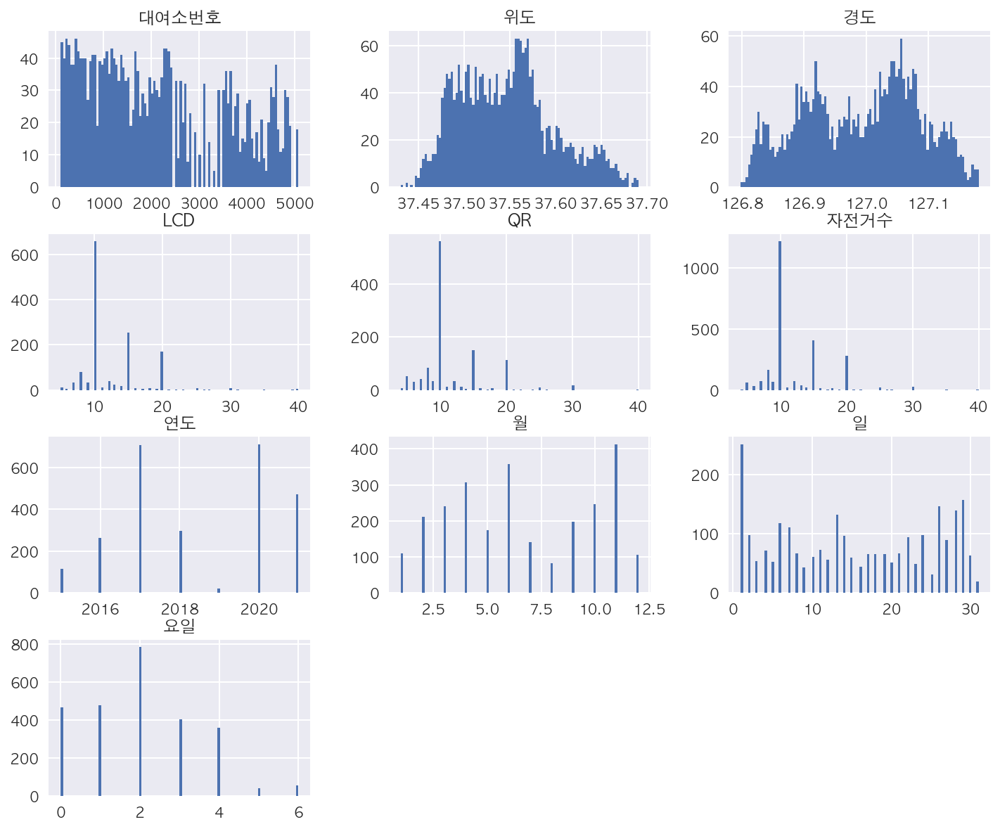

In [17]:
# hist
df.hist(figsize=(12, 10), bins=100)
plt.show()

### 특정 수치 변수의 히스토그램

<AxesSubplot:xlabel='LCD', ylabel='Count'>

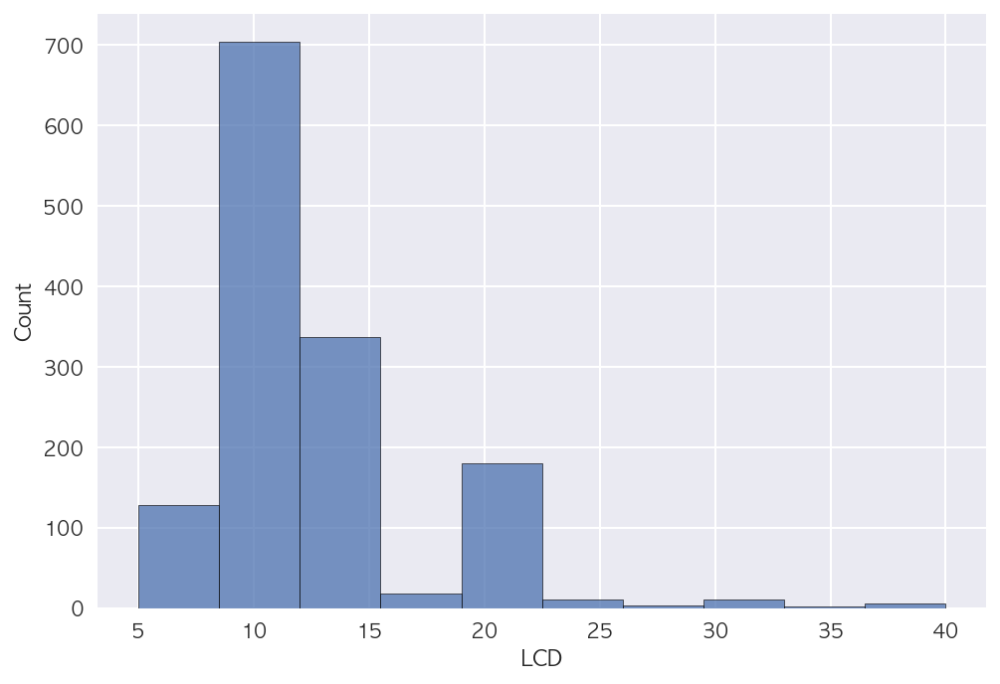

In [18]:
# LCD histplot
sns.histplot(data=df, x="LCD", bins=10)

<AxesSubplot:ylabel='Count'>

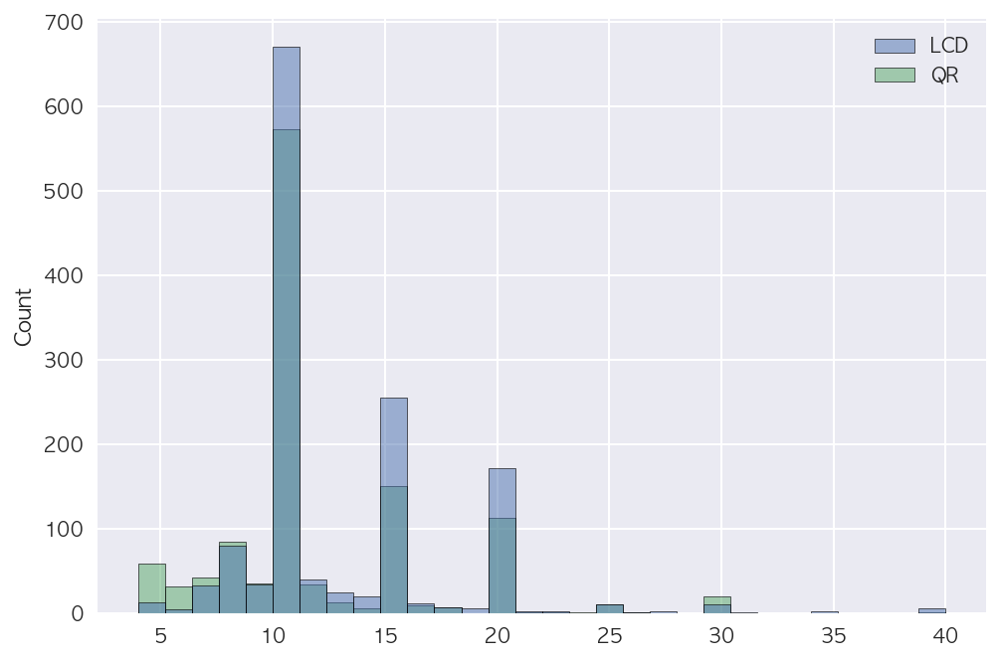

In [19]:
# "LCD", "QR" histplot
sns.histplot(df[["LCD", "QR"]], bins=30)

<AxesSubplot:xlabel='LCD'>

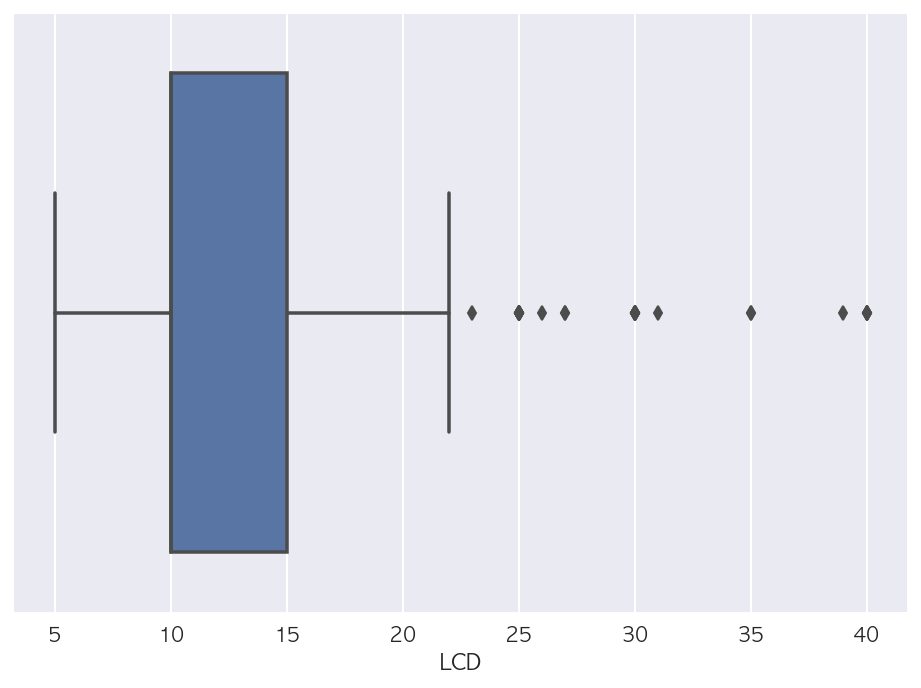

In [20]:
# "LCD" boxplot
sns.boxplot(data=df, x="LCD")

<AxesSubplot:>

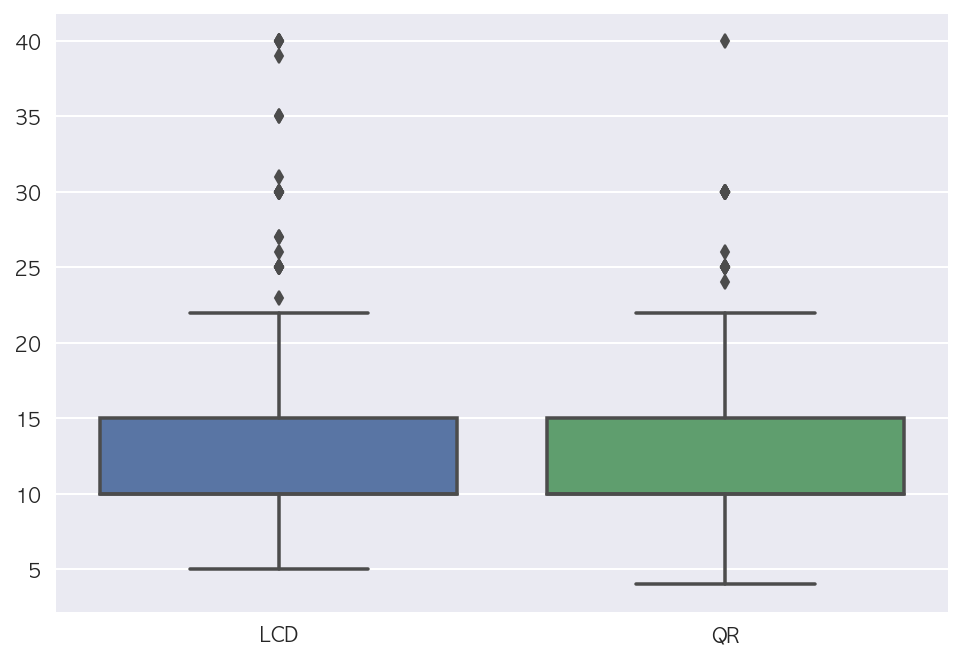

In [21]:
# "LCD", "QR" boxplot
sns.boxplot(data=df[["LCD", "QR"]])

<AxesSubplot:xlabel='LCD', ylabel='Density'>

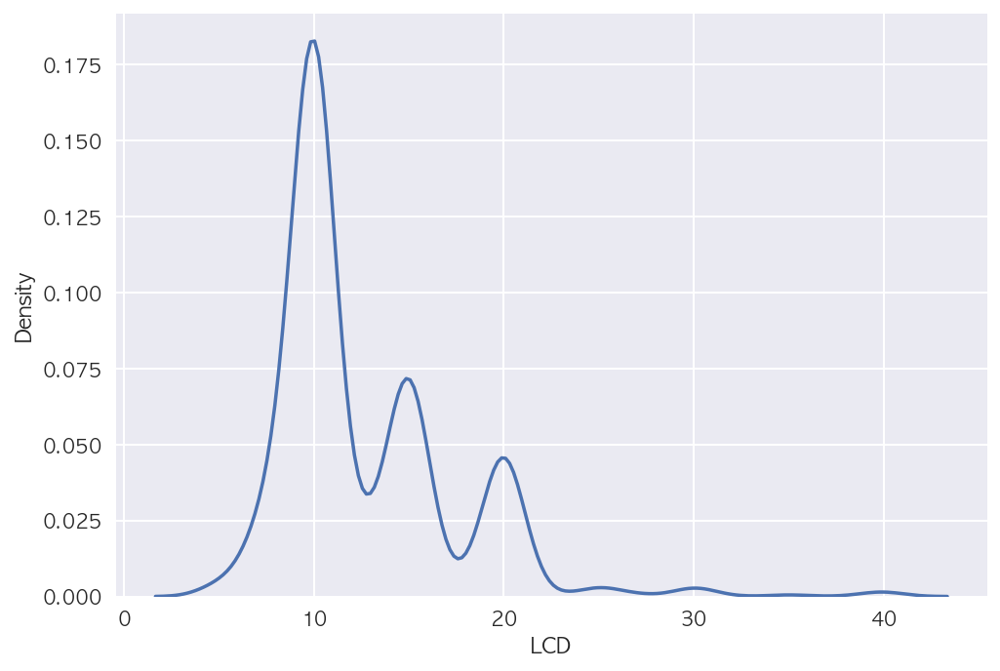

In [22]:
# "LCD" kdeplot
sns.kdeplot(data=df, x="LCD")

<AxesSubplot:ylabel='Density'>

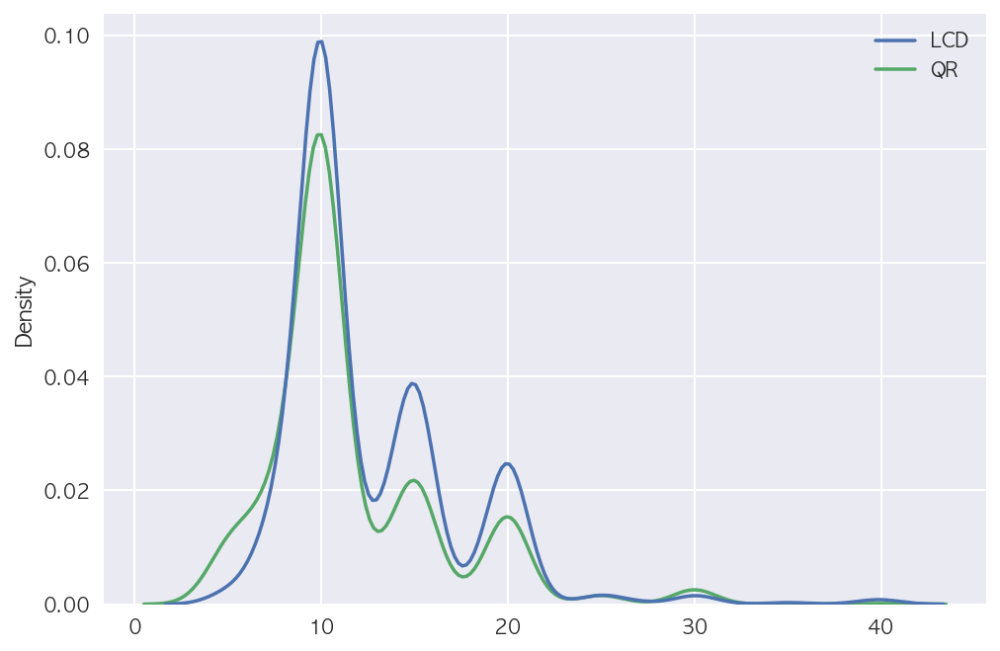

In [23]:
# "LCD", "QR" kdeplot
sns.kdeplot(data=df[["LCD", "QR"]])

<AxesSubplot:xlabel='LCD'>

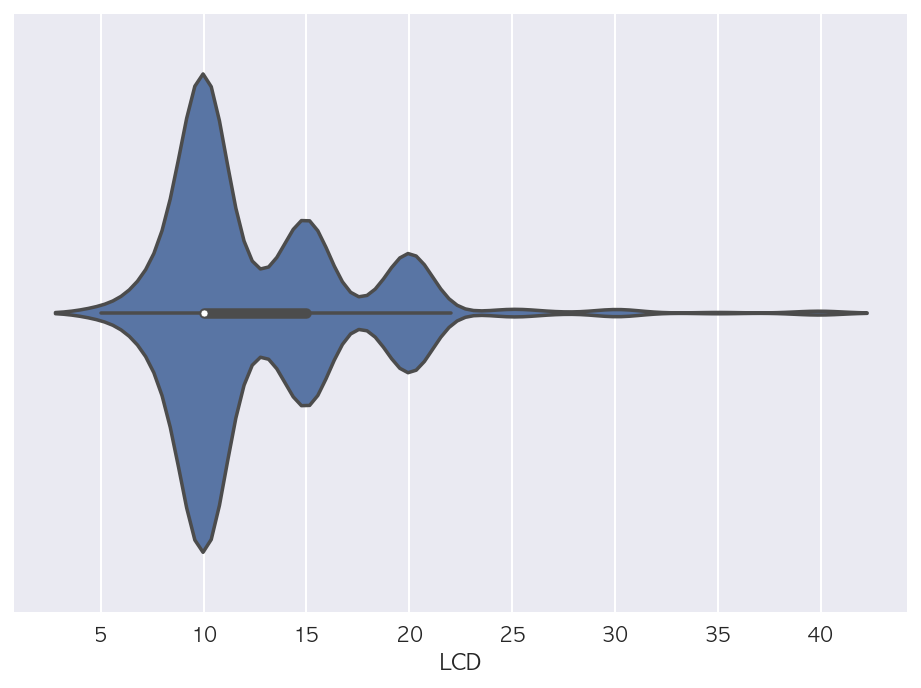

In [24]:
# "LCD" violinplot
sns.violinplot(data=df, x="LCD")

<AxesSubplot:>

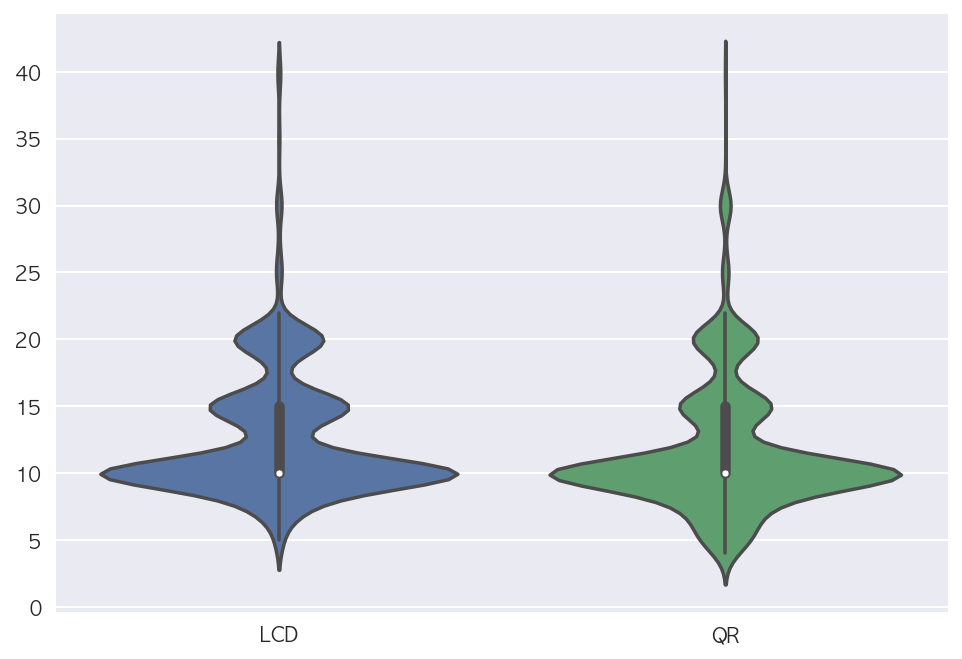

In [25]:
# "LCD", "QR" violinplot
sns.violinplot(data=df[["LCD", "QR"]])

## 두 개의 수치 데이터 비교

<AxesSubplot:xlabel='경도', ylabel='위도'>

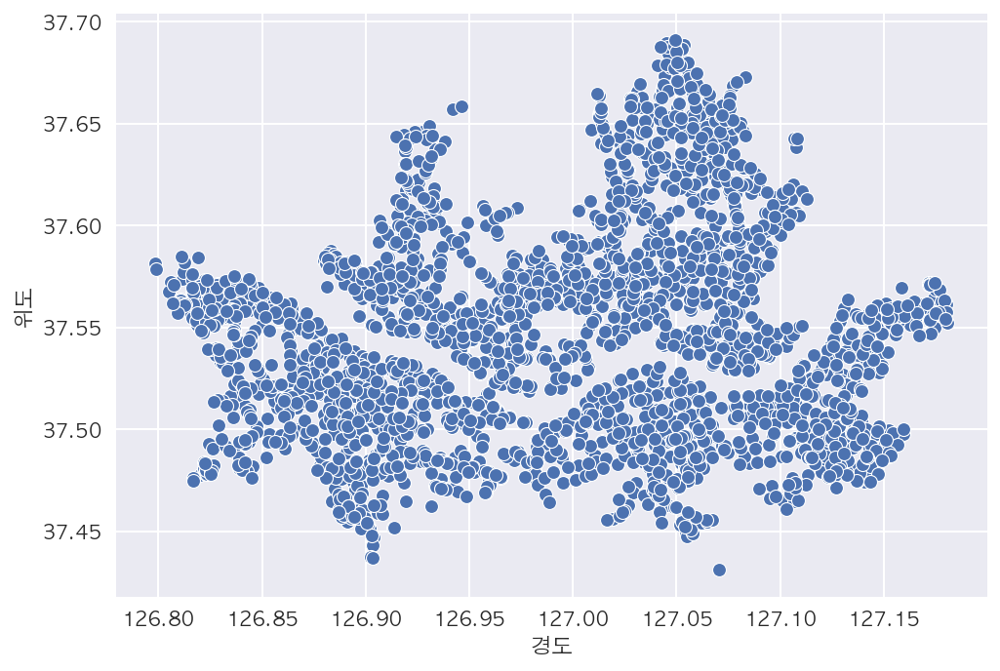

In [26]:
# scatterplot 으로 경도와 위도를 시각화 합니다.
sns.scatterplot(data=df, x="경도", y="위도")

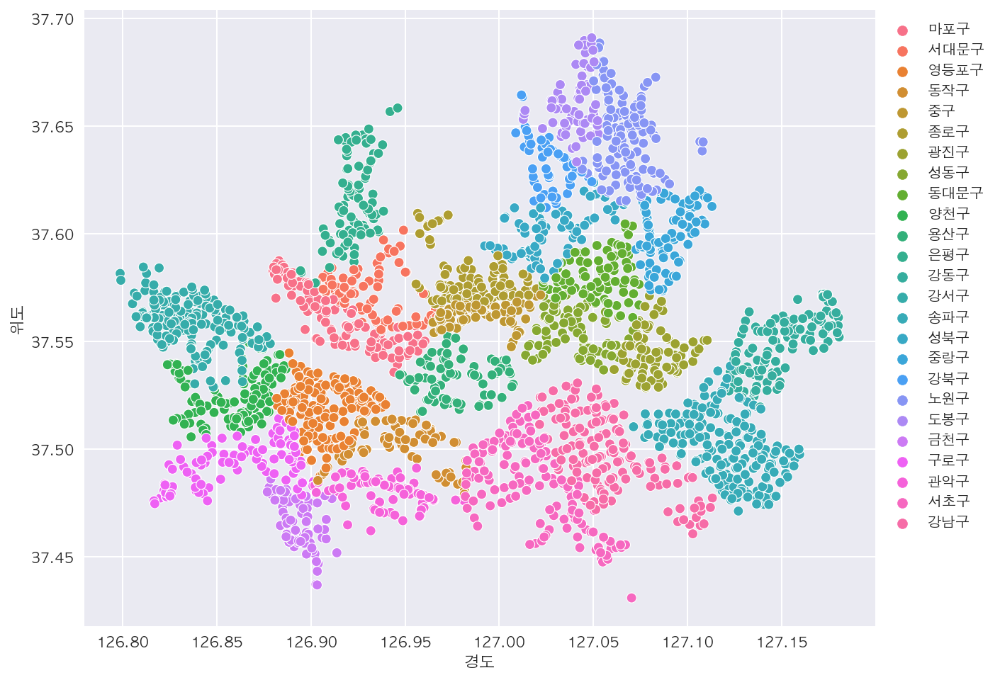

In [27]:
# scatterplot 으로 경도와 위도를 시각화 합니다. 자치구에 따라 다른 색상으로 표시합니다.
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="경도", y="위도", hue="자치구")
plt.legend(bbox_to_anchor=(1, 1))

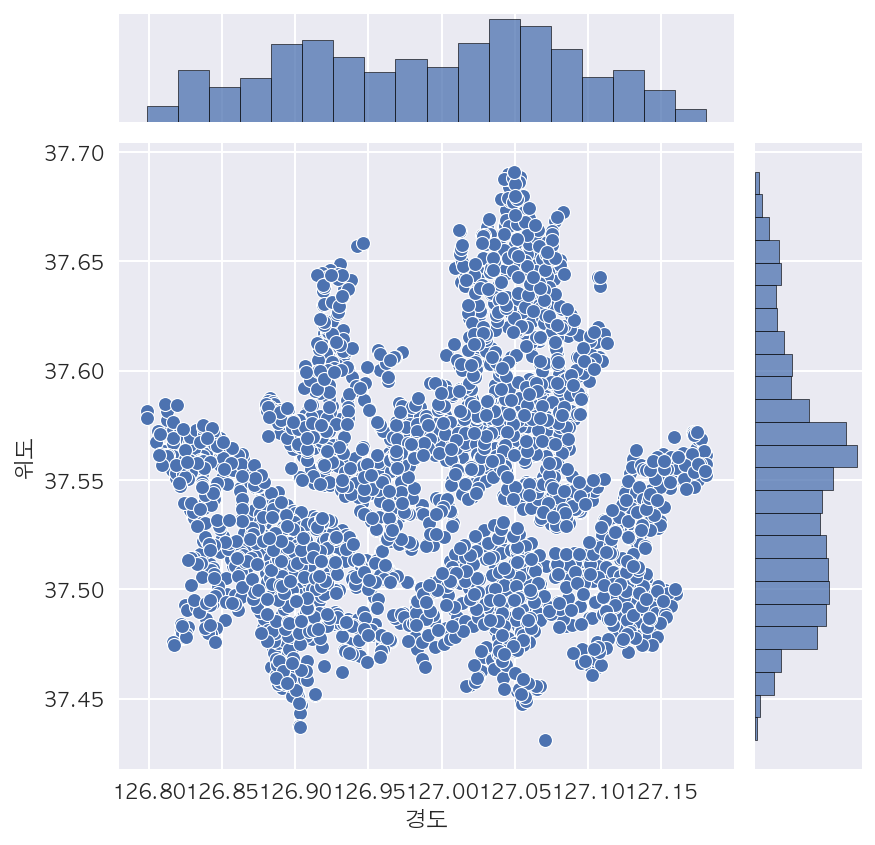

In [28]:
# jointplot 으로 경도와 위도를 시각화 합니다. 
sns.jointplot(data=df, x="경도", y="위도")

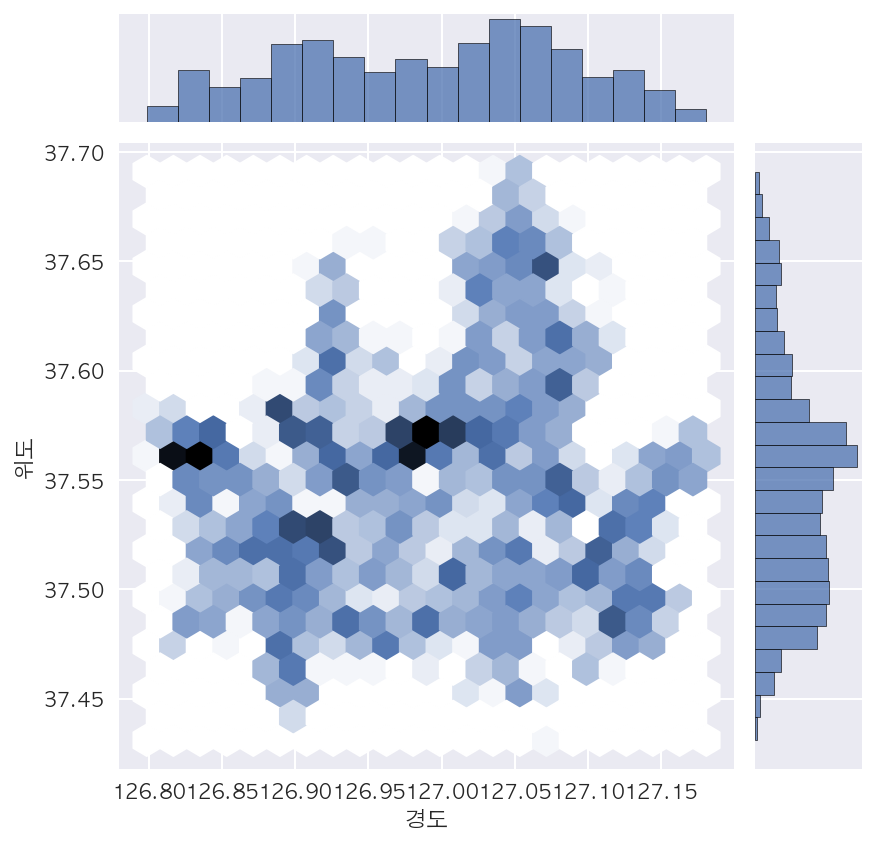

In [29]:
# jointplot 으로 경도와 위도를 시각화 합니다. kind="hex"
# "scatter" | "kde" | "hist" | "hex" | "reg" | "resid"

sns.jointplot(data=df, x="경도", y="위도", kind="hex")

### 상관 분석

상관 분석(相關 分析, Correlation analysis) 또는 '상관관계' 또는 '상관'은 확률론과 통계학에서 두 변수간에 어떤 선형적 또는 비선형적 관계를 갖고 있는지를 분석하는 방법이다. 두 변수는 서로 독립적인 관계이거나 상관된 관계일 수 있으며 이때 두 변수간의 관계의 강도를 상관관계(Correlation, Correlation coefficient)라 한다. 상관분석에서는 상관관계의 정도를 나타내는 단위로 모상관계수로 ρ를 사용하며 표본 상관 계수로 r 을 사용한다.

상관관계의 정도를 파악하는 상관 계수(相關係數, Correlation coefficient)는 두 변수간의 연관된 정도를 나타낼 뿐 인과관계를 설명하는 것은 아니다. 두 변수간에 원인과 결과의 인과관계가 있는지에 대한 것은 회귀분석을 통해 인과관계의 방향, 정도와 수학적 모델을 확인해 볼 수 있다.

* 출처 : https://ko.wikipedia.org/wiki/%EC%83%81%EA%B4%80_%EB%B6%84%EC%84%9D

### 피어슨 상관계수

* r 값은 X 와 Y 가 완전히 동일하면 +1, 전혀 다르면 0, 반대방향으로 완전히 동일 하면 –1 을 가진다. 
* 결정계수(coefficient of determination)는 r^2 로 계산하며 이것은 X 로부터 Y 를 예측할 수 있는 정도를 의미한다.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/d/d4/Correlation_examples2.svg/800px-Correlation_examples2.svg.png" width="500">

```
일반적으로
r이 -1.0과 -0.7 사이이면, 강한 음적 선형관계,
r이 -0.7과 -0.3 사이이면, 뚜렷한 음적 선형관계,
r이 -0.3과 -0.1 사이이면, 약한 음적 선형관계,
r이 -0.1과 +0.1 사이이면, 거의 무시될 수 있는 선형관계,
r이 +0.1과 +0.3 사이이면, 약한 양적 선형관계,
r이 +0.3과 +0.7 사이이면, 뚜렷한 양적 선형관계,
r이 +0.7과 +1.0 사이이면, 강한 양적 선형관계
```

<img src="https://upload.wikimedia.org/wikipedia/commons/3/34/Correlation_coefficient.png" width=500>

* 출처 :  https://ko.wikipedia.org/wiki/%EC%83%81%EA%B4%80_%EB%B6%84%EC%84%9D#%ED%94%BC%EC%96%B4%EC%8A%A8_%EC%83%81%EA%B4%80_%EA%B3%84%EC%88%98



### 상관계수 구하기

In [30]:
corr = df.corr()
corr

,대여소번호,위도,경도,LCD,QR,자전거수,연도,월,일,요일
대여소번호,1.000000,-0.139171,0.093099,-0.028797,-0.337128,-0.226487,0.696402,-0.088803,0.014112,-0.091183
위도,-0.139171,1.000000,0.118949,-0.049578,-0.012813,-0.032951,-0.015712,0.023863,-0.034055,0.077120
경도,0.093099,0.118949,1.000000,0.023217,-0.130807,-0.050803,0.044191,-0.094617,0.032702,-0.009566
LCD,-0.028797,-0.049578,0.023217,1.000000,NaN,0.999602,-0.120054,-0.010262,-0.003719,0.049055
QR,-0.337128,-0.012813,-0.130807,NaN,1.000000,0.992636,-0.258451,-0.240586,0.025638,0.092768
자전거수,-0.226487,-0.032951,-0.050803,0.999602,0.992636,1.000000,-0.159936,-0.073331,0.002076,0.066039
연도,0.696402,-0.015712,0.044191,-0.120054,-0.258451,-0.159936,1.000000,-0.370227,0.087550,0.024505
월,-0.088803,0.023863,-0.094617,-0.010262,-0.240586,-0.073331,-0.370227,1.000000,-0.167930,0.027725
일,0.014112,-0.034055,0.032702,-0.003719,0.025638,0.002076,0.087550,-0.167930,1.000000,0.019580
요일,-0.091183,0.077120,-0.009566,0.049055,0.092768,0.066039,0.024505,0.027725,0.019580,1.000000


In [31]:
# mask 구하기
mask = np.triu(np.ones_like(corr))

In [32]:
print(plt.colormaps())

['magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges', 'PRGn', 'PiYG', 'PuBu', 'PuBuGn', 'PuOr', 'PuRd', 'Purples', 'RdBu', 'RdGy', 'RdPu', 'RdYlBu', 'RdYlGn', 'Reds', 'Spectral', 'Wistia', 'YlGn', 'YlGnBu', 'YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary', 'bone', 'brg', 'bwr', 'cool', 'coolwarm', 'copper', 'cubehelix', 'flag', 'gist_earth', 'gist_gray', 'gist_heat', 'gist_ncar', 'gist_rainbow', 'gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray', 'hot', 'hsv', 'jet', 'nipy_spectral', 'ocean', 'pink', 'prism', 'rainbow', 'seismic', 'spring', 'summer', 'terrain', 'winter', 'Accent', 'Dark2', 'Paired', 'Pastel1', 'Pastel2', 'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b', 'tab20c', 'magma_r', 'inferno_r', 'plasma_r', 'viridis_r', 'cividis_r', 'twilight_r', 'twilight_shifted_r', 'turbo_r', 'Blues_r', 'BrBG_r', 'BuGn_r', 'BuPu_r', 'CMRmap_r', 'GnBu_r', 'G

<AxesSubplot:>

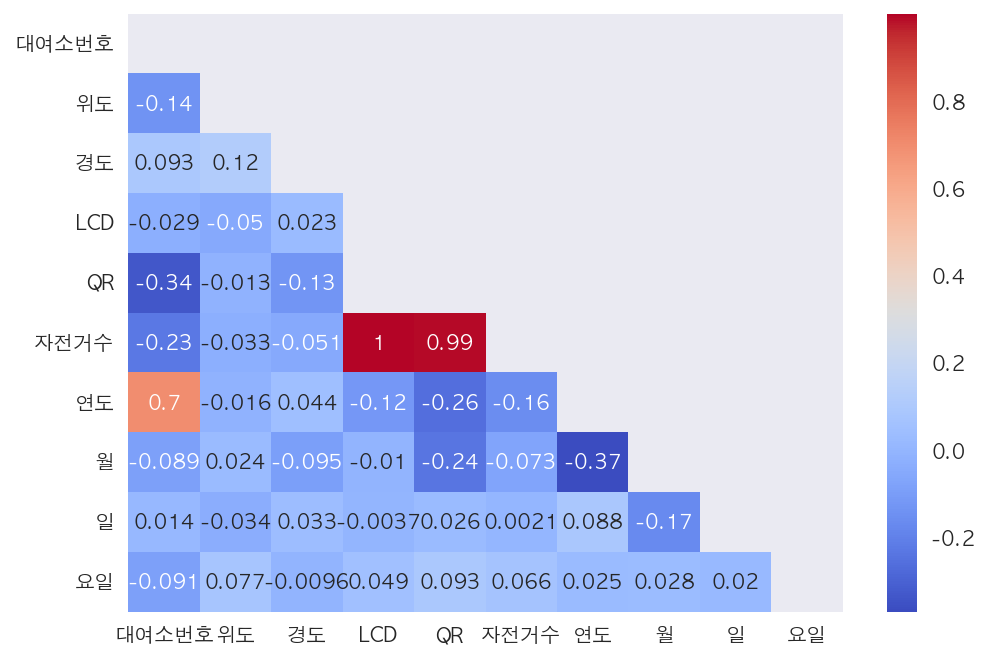

In [33]:
# heatmap 시각화
sns.heatmap(corr, annot=True, cmap="coolwarm", mask=mask)

## 범주형 데이터

## 변수 하나의 빈도수 구하기

In [34]:
df.dtypes

대여소번호    float64
대여소명      object
자치구       object
상세주소      object
위도       float64
경도       float64
설치시기      object
LCD      float64
QR       float64
운영방식      object
자전거수       int64
연도         int64
월          int64
일          int64
요일         int64
dtype: object

In [35]:
df.nunique()

대여소번호    2586
대여소명     2584
자치구        25
상세주소     2486
위도       2508
경도       2507
설치시기     1068
LCD        27
QR         23
운영방식        2
자전거수       29
연도          7
월          12
일          31
요일          7
dtype: int64

In [36]:
# 대여소별 운영방식 value_counts
op_count = df["운영방식"].value_counts()
op_count

LCD    1400
QR     1186
Name: 운영방식, dtype: int64

<AxesSubplot:>

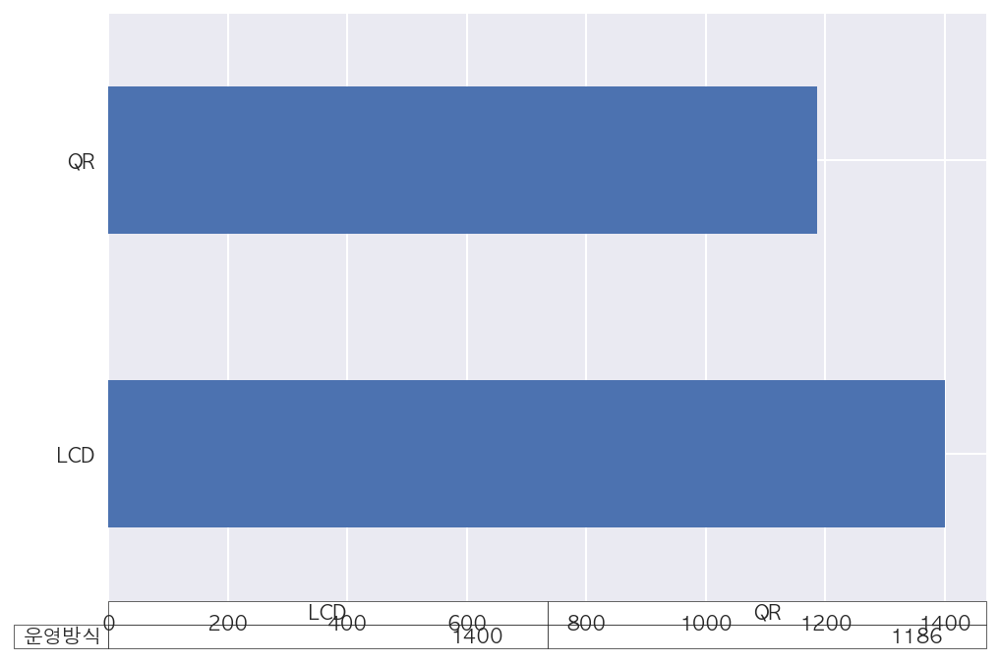

In [37]:
op_count.plot.barh(table=True)

In [38]:
# 대여소별 운영방식 value_counts 의 비율로 구하기
df["운영방식"].value_counts(normalize=True) * 100

LCD    54.137664
QR     45.862336
Name: 운영방식, dtype: float64

In [39]:
# 자치구별 대여소 빈도 수 value_counts 로 구하기
gu_count = df["자치구"].value_counts()
gu_count

송파구     207
강서구     181
강남구     153
영등포구    142
서초구     141
노원구     123
마포구     117
강동구     117
종로구     105
양천구     103
구로구      99
은평구      93
중랑구      90
광진구      86
중구       84
성동구      84
용산구      83
동대문구     82
성북구      77
관악구      76
서대문구     75
금천구      72
동작구      70
도봉구      68
강북구      58
Name: 자치구, dtype: int64

<AxesSubplot:>

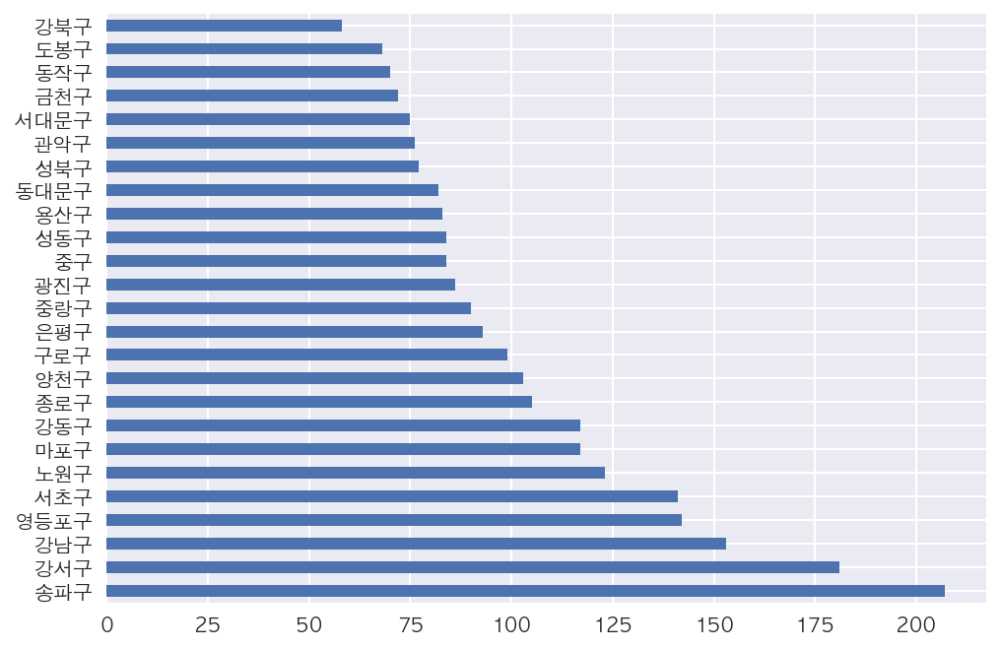

In [40]:
gu_count.plot.barh()

In [41]:
gu_count.index

Index(['송파구', '강서구', '강남구', '영등포구', '서초구', '노원구', '마포구', '강동구', '종로구', '양천구',
       '구로구', '은평구', '중랑구', '광진구', '중구', '성동구', '용산구', '동대문구', '성북구', '관악구',
       '서대문구', '금천구', '동작구', '도봉구', '강북구'],
      dtype='object')

<AxesSubplot:xlabel='count', ylabel='자치구'>

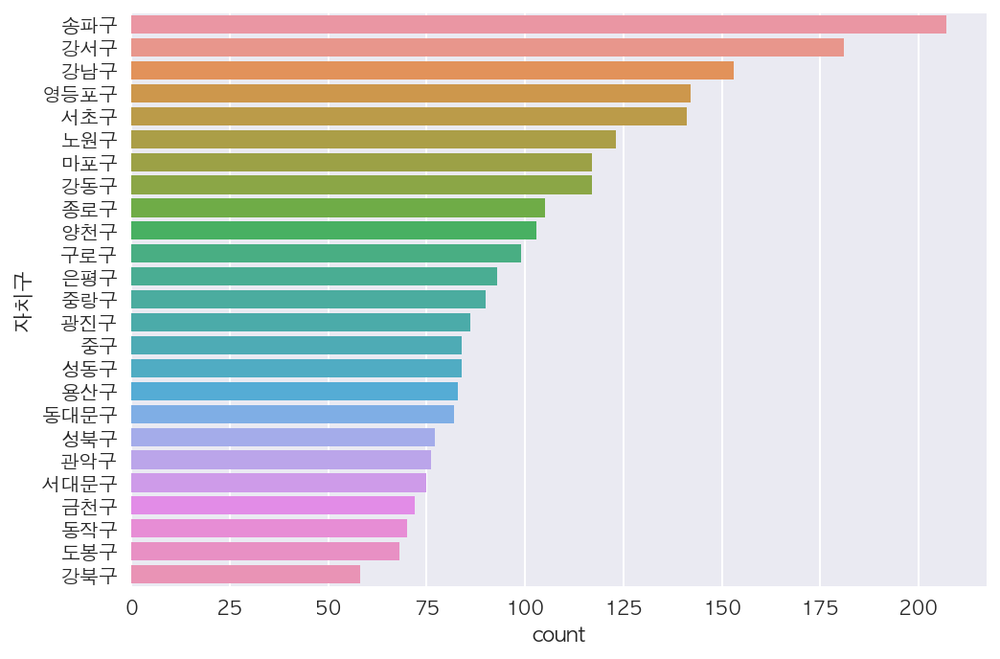

In [42]:
# countplot 으로 자치구별 빈도수 구하기
sns.countplot(data=df.sort_values("자치구"), y="자치구", order=gu_count.index)

## 변수 두 개의 빈도수 

In [43]:
# 운영방식, 자치구 교차표 구하기
pd.crosstab(index=df["운영방식"], columns=df["자치구"])

자치구,강남구,강동구,강북구,강서구,관악구,광진구,구로구,금천구,노원구,도봉구,...,성동구,성북구,송파구,양천구,영등포구,용산구,은평구,종로구,중구,중랑구
운영방식,,,,,,,,,,,,,,,,,,,,,
LCD,93,54,36,74,46,51,64,42,60,33,...,56,52,93,52,76,39,59,59,29,49
QR,60,63,22,107,30,35,35,30,63,35,...,28,25,114,51,66,44,34,46,55,41


<AxesSubplot:xlabel='count', ylabel='자치구'>

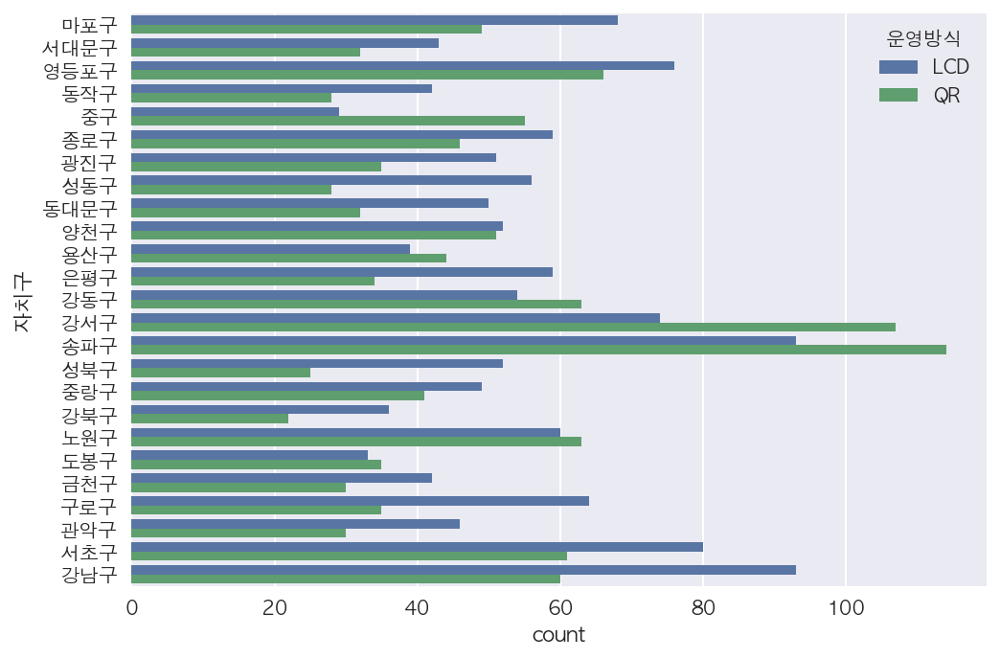

In [44]:
# 운영방식, 자치구 countplot
sns.countplot(data=df, y="자치구", hue="운영방식")

## 범주형 vs 수치형 데이터 비교
* seaborn 의 통계연산을 지원하는 그래프 사용
* pandas 의 groupby 를 통해 데이터 집계하기

### 막대그래프

Text(0.5, 1.0, '대여소별 평균 자전거 수')

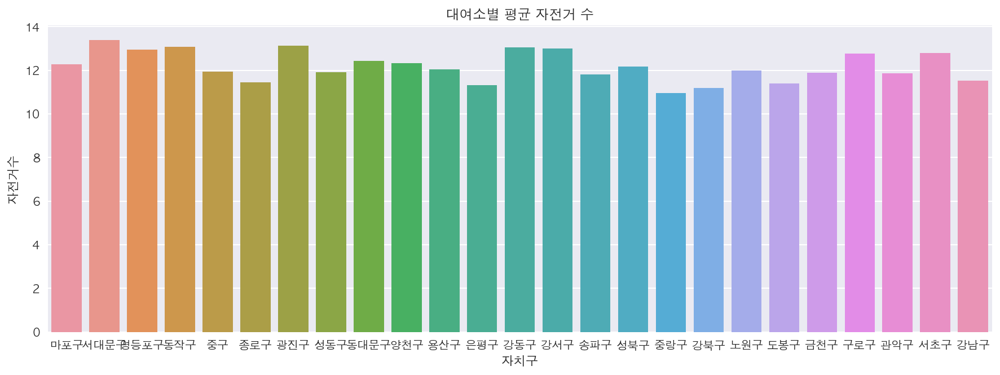

In [45]:
# 자치구 별 대여소별 평균 자전거 수 barplot 
plt.figure(figsize=(15, 5))
sns.barplot(data=df, x="자치구", y="자전거수", ci=None).set_title("대여소별 평균 자전거 수")

Text(0.5, 1.0, '대여소별 합계 자전거 수')

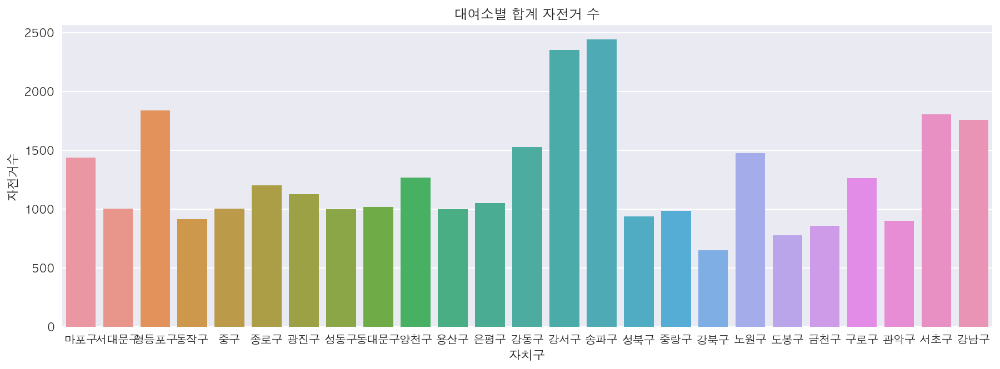

In [46]:
# 자치구 별 대여소별 합계 자전거 수 barplot 
plt.figure(figsize=(15, 5))

sns.barplot(data=df, x="자치구", y="자전거수", ci=None, estimator=np.sum).set_title("대여소별 합계 자전거 수")

### groupby

<img src = 'https://pandas.pydata.org/docs/_images/06_groupby.svg' width="800">

In [47]:
# 자치구별 자전거 수 합계
gu_bike_count = df.groupby("자치구")["자전거수"].sum()
gu_bike_count

자치구
강남구     1761
강동구     1527
강북구      649
강서구     2352
관악구      901
광진구     1128
구로구     1264
금천구      856
노원구     1476
도봉구      775
동대문구    1019
동작구      916
마포구     1437
서대문구    1004
서초구     1804
성동구     1001
성북구      936
송파구     2444
양천구     1269
영등포구    1838
용산구      999
은평구     1052
종로구     1201
중구      1002
중랑구      986
Name: 자전거수, dtype: int64

<AxesSubplot:title={'center':'자치구별 자전거 수 합계'}, xlabel='자치구'>

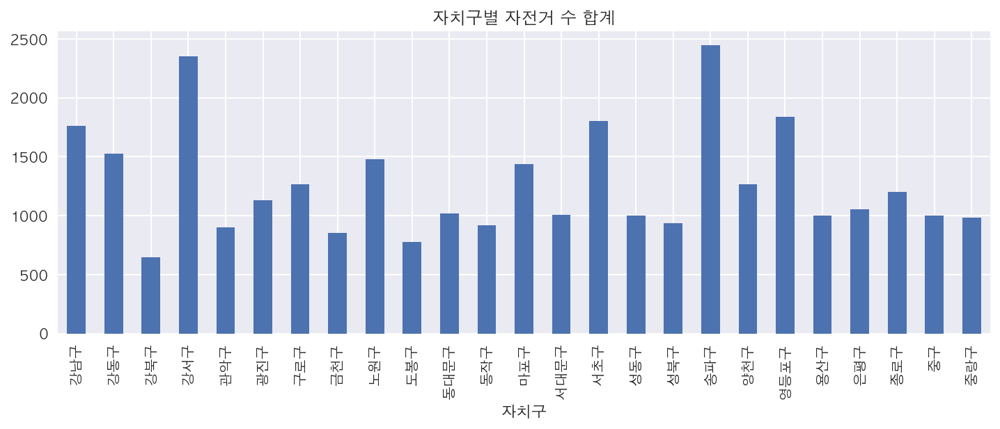

In [48]:
# 자치구별 자전거 수 합계 시각화
gu_bike_count.plot.bar(title="자치구별 자전거 수 합계", figsize=(12, 4))

### pivot_table



<img src = 'https://pandas.pydata.org/docs/_images/reshaping_pivot.png' width = '600'>

In [49]:
# 자치구별 자전거 수 합계
gu_bike_sum = pd.pivot_table(data=df, index="자치구", values="자전거수", aggfunc="sum")
gu_bike_sum

,자전거수
자치구,
강남구,1761
강동구,1527
강북구,649
강서구,2352
관악구,901
광진구,1128
구로구,1264
금천구,856
노원구,1476


<AxesSubplot:xlabel='자치구'>

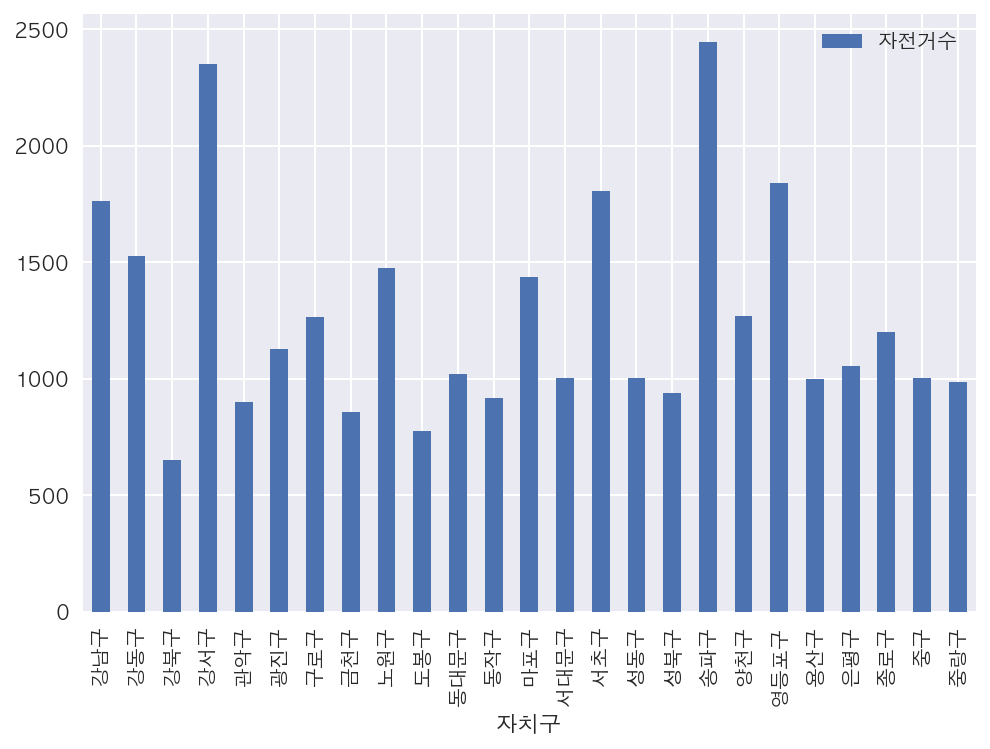

In [50]:
gu_bike_sum.plot.bar()

<AxesSubplot:xlabel='자치구', ylabel='자전거수'>

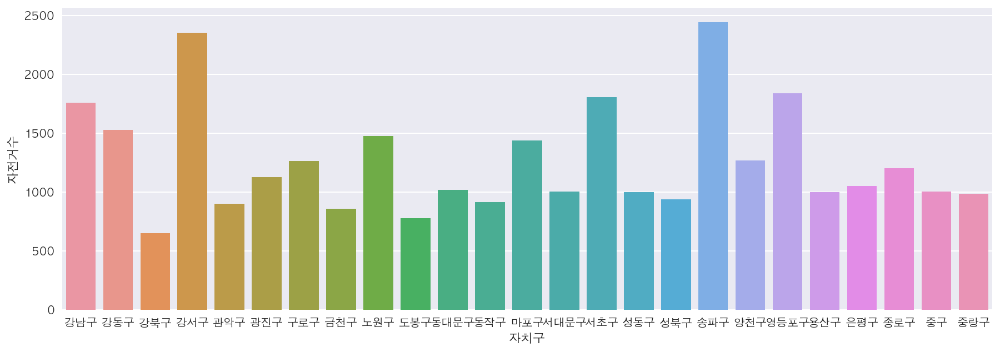

In [51]:
# 자치구별 자전거 수 합계 sns.barplot 으로 시각화
plt.figure(figsize=(15, 5))
sns.barplot(data=gu_bike_sum, x=gu_bike_sum.index, y=gu_bike_sum["자전거수"])

### 상자수염그림
* boxplot


#### 기술통계 용어

* 백분위 수 : 데이터를 백등분 한 것
* 사분위 수 : 데이터를 4등분 한 것
* 중위수 : 데이터의 정 가운데 순위에 해당하는 값.(관측치의 절반은 크거나 같고 나머지 절반은 작거나 같다.)
* 제 3사분위 수 (Q3) : 중앙값 기준으로 상위 50% 중의 중앙값, 전체 데이터 중 상위 25%에 해당하는 값
* 제 1사분위 수 (Q1) : 중앙값 기준으로 하위 50% 중의 중앙값, 전체 데이터 중 하위 25%에 해당하는 값
* 사분위 범위 수(IQR) : 데이터의 중간 50% (Q3 - Q1)

* 출처 : [상자 수염 그림 - 위키백과, 우리 모두의 백과사전](https://ko.wikipedia.org/wiki/%EC%83%81%EC%9E%90_%EC%88%98%EC%97%BC_%EA%B7%B8%EB%A6%BC)

<img src="https://miro.medium.com/max/1400/1*NRlqiZGQdsIyAu0KzP7LaQ.png" width="400">

* 이미지 출처 : https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51

<AxesSubplot:xlabel='자치구', ylabel='자전거수'>

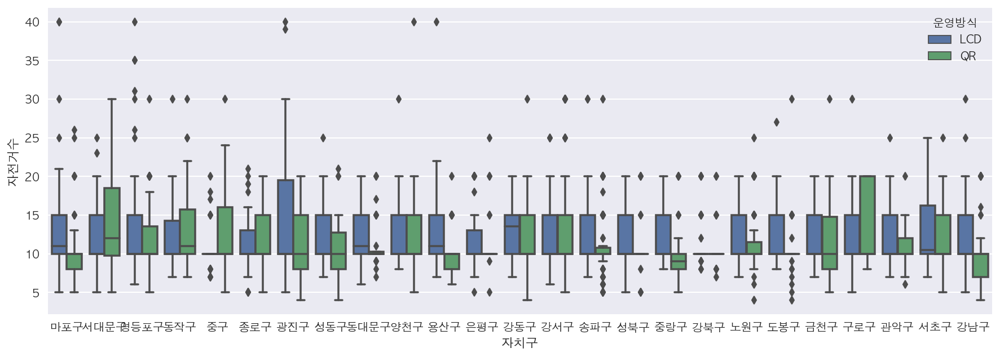

In [52]:
# 자치구별 자전거 수 sns.boxplot 으로 시각화 hue="운영방식"
plt.figure(figsize=(15, 5))
sns.boxplot(data=df, x="자치구", y="자전거수", hue="운영방식")

In [53]:
# 위에서 구한 boxplot 에 대한 수치를 groupby로 구해봅니다.
df.groupby(by=["자치구", "운영방식"])["자전거수"].describe()

count       mean       std  min    25%   50%    75%   max
자치구  운영방식                                                           
강남구  LCD    93.0  12.440860  4.014816  5.0  10.00  10.0  15.00  30.0
     QR     60.0  10.066667  4.205995  4.0   7.00  10.0  10.00  20.0
강동구  LCD    54.0  13.277778  3.867702  7.0  10.00  13.5  15.00  20.0
     QR     63.0  12.857143  4.737827  4.0  10.00  10.0  15.00  30.0
강북구  LCD    36.0  11.250000  3.201562  8.0  10.00  10.0  10.00  20.0
     QR     22.0  11.090909  3.610950  7.0  10.00  10.0  10.00  20.0
강서구  LCD    74.0  11.932432  4.352077  6.0  10.00  10.0  15.00  25.0
     QR    107.0  13.728972  6.682235  5.0  10.00  10.0  15.00  30.0
관악구  LCD    46.0  12.347826  4.050884  7.0  10.00  10.0  15.00  25.0
     QR     30.0  11.100000  3.111159  6.0  10.00  10.0  12.00  20.0
광진구  LCD    51.0  14.431373  7.749206  5.0  10.00  10.0  19.50  40.0
     QR     35.0  11.200000  4.695430  4.0   8.00  10.0  15.00  20.0
구로구  LCD    64.0  12.312500  4.290540  5.0  10.00  10.0  15.00  30.0
     QR     35.0  13.600000  4.741556  8.0  10.00  10.0  20.00  20.0
금천구  LCD    42.0  12.261905  3.975900  7.0  10.00  10.0  15.00  20.0
     QR     30.0  11.366667  5.573851  5.0   8.00  10.0  14.75  30.0
노원구  LCD    60.0  12.650000  3.861259  7.0  10.00  10.0  15.00  20.0
     QR     63.0  11.380952  4.105184  4.0  10.00  10.0  11.50  25.0
도봉구  LCD    33.0  12.212121  3.911182  8.0  10.00  10.0  15.00  27.0
     QR     35.0  10.628571  4.250161  4.0  10.00  10.0  10.00  30.0
동대문구 LCD    50.0  13.180000  4.221858  6.0  10.00  11.0  15.00  20.0
     QR     32.0  11.250000  3.192734  7.0  10.00  10.0  10.25  20.0
동작구  LCD    42.0  12.357143  4.546891  7.0  10.00  10.0  14.25  30.0
     QR     28.0  14.178571  5.824937  7.0  10.00  11.0  15.75  30.0
마포구  LCD    68.0  13.602941  6.649295  5.0  10.00  11.0  15.00  40.0
     QR     49.0  10.448980  4.769963  5.0   8.00  10.0  10.00  26.0
서대문구 LCD    43.0  13.000000  5.019011  5.0  10.00  10.0  15.00  25.0
     QR     32.0  13.906250  6.556747  5.0   9.75  12.0  18.50  30.0
서초구  LCD    80.0  13.650000  4.696080  7.0  10.00  10.5  16.25  25.0
     QR     61.0  11.672131  4.052659  5.0  10.00  10.0  15.00  25.0
성동구  LCD    56.0  12.428571  4.443001  7.0  10.00  10.0  15.00  25.0
     QR     28.0  10.892857  4.297625  4.0   8.00  10.0  12.75  21.0
성북구  LCD    52.0  12.750000  4.351583  5.0  10.00  10.0  15.00  20.0
     QR     25.0  10.920000  4.122297  5.0  10.00  10.0  10.00  20.0
송파구  LCD    93.0  13.021505  4.636759  7.0  10.00  10.0  15.00  30.0
     QR    114.0  10.815789  3.817903  5.0  10.00  10.0  10.75  30.0
양천구  LCD    52.0  12.403846  4.074115  8.0  10.00  10.0  15.00  30.0
     QR     51.0  12.235294  5.472068  5.0  10.00  10.0  15.00  40.0
영등포구 LCD    76.0  14.026316  6.797987  6.0  10.00  10.0  15.00  40.0
     QR     66.0  11.696970  4.482340  5.0  10.00  10.0  13.50  30.0
용산구  LCD    39.0  13.794872  5.965601  7.0  10.00  11.0  15.00  40.0
     QR     44.0  10.477273  3.121483  6.0   8.00  10.0  10.00  20.0
은평구  LCD    59.0  11.406780  3.591746  5.0  10.00  10.0  13.00  20.0
     QR     34.0  11.147059  3.718360  5.0  10.00  10.0  10.00  25.0
종로구  LCD    59.0  11.322034  3.602876  5.0  10.00  10.0  13.00  21.0
     QR     46.0  11.586957  4.235176  5.0  10.00  10.0  15.00  20.0
중구   LCD    29.0  10.793103  3.342148  7.0  10.00  10.0  10.00  20.0
     QR     55.0  12.527273  4.943587  5.0  10.00  10.0  16.00  30.0
중랑구  LCD    49.0  11.836735  2.953437  8.0  10.00  10.0  15.00  20.0
     QR     41.0   9.902439  3.645579  5.0   8.00   9.0  10.00  20.0

### 바이올린플롯

<AxesSubplot:xlabel='자치구', ylabel='자전거수'>

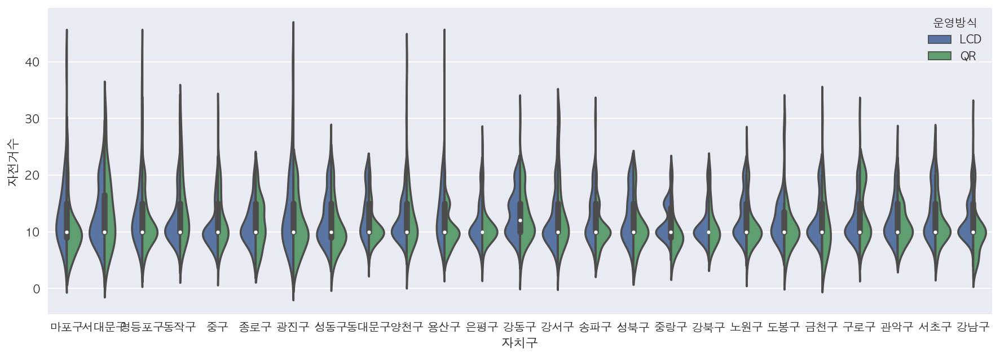

In [54]:
# 자치구별 자전거 수 sns.boxplot 으로 시각화 hue="운영방식"
plt.figure(figsize=(15, 5))

sns.violinplot(data=df, x="자치구", y="자전거수", hue="운영방식", split=True)

## 설치 시기
### 선그래프

Text(0.5, 1.0, '평균 대여소별 자전거 설치수')

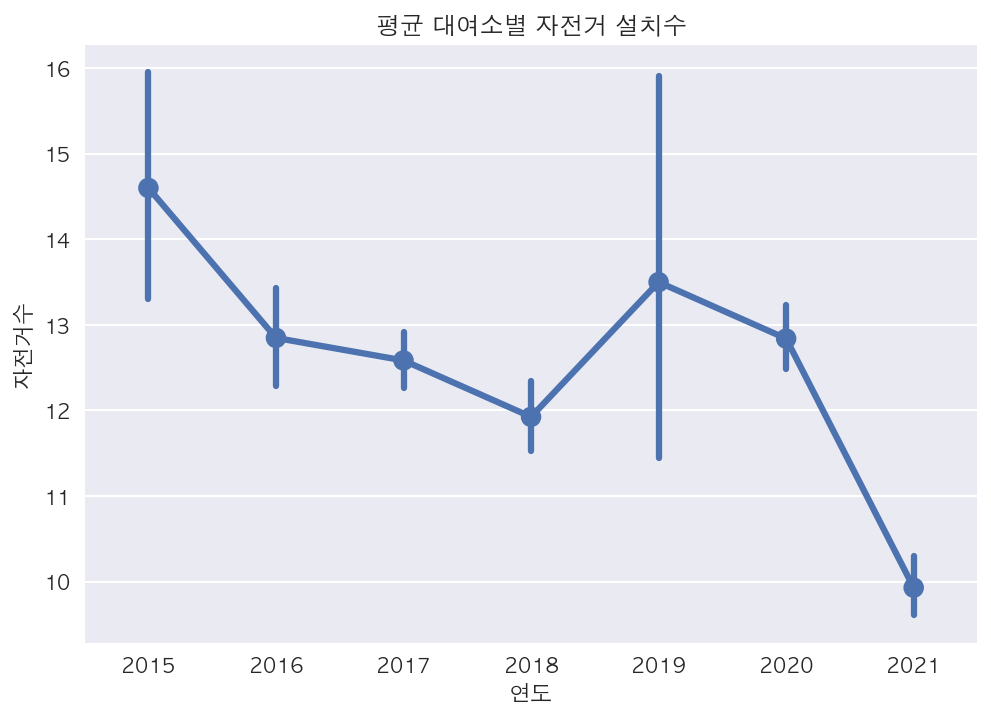

In [55]:
sns.pointplot(data=df, x="연도", y="자전거수").set_title("평균 대여소별 자전거 설치수")

Text(0.5, 1.0, '대여소별 자전거 합계 설치수')

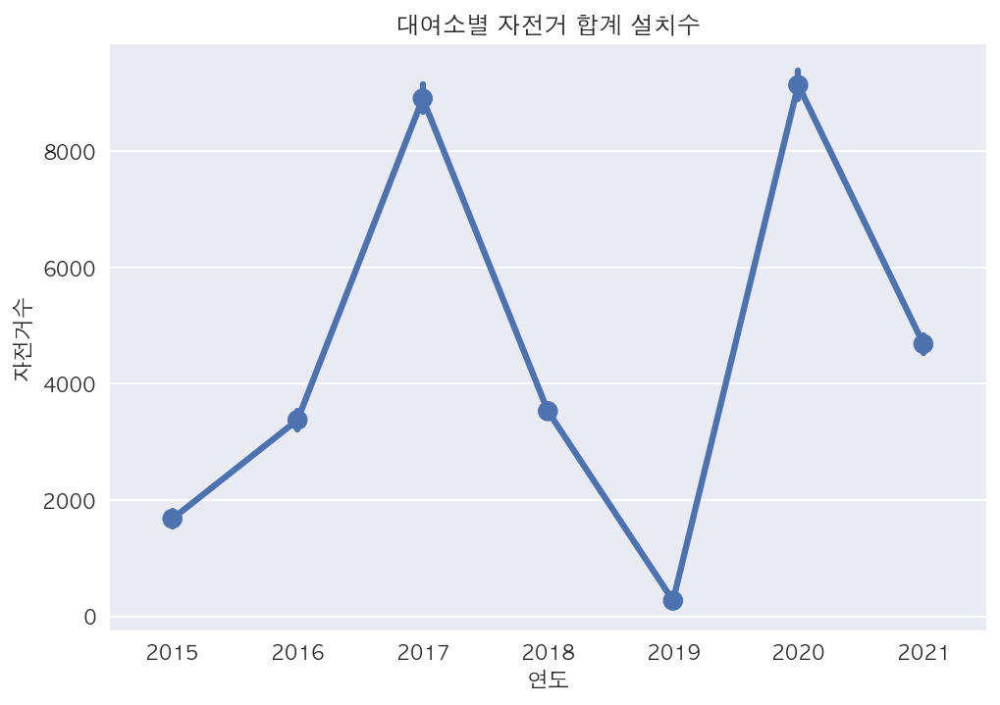

In [56]:
sns.pointplot(data=df, x="연도", y="자전거수", estimator=np.sum,
             ).set_title("대여소별 자전거 합계 설치수")

Text(0.5, 1.0, '대여소별 자전거 합계 설치수')

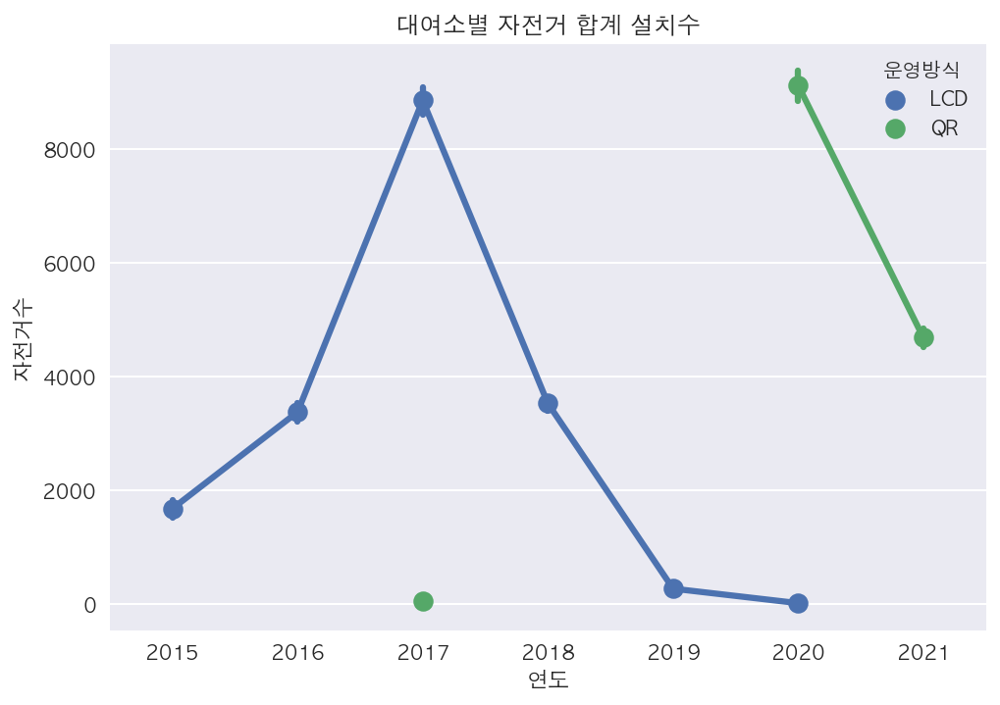

In [57]:
# pointplot  x="연도", y="자전거수", hue="운영방식" 합계
sns.pointplot(data=df, x="연도", y="자전거수", estimator=np.sum, hue="운영방식"
             ).set_title("대여소별 자전거 합계 설치수")

In [58]:
df[(df["연도"] == 2017) & (df["운영방식"] == "QR")]

,대여소번호,대여소명,자치구,상세주소,위도,경도,설치시기,LCD,QR,운영방식,자전거수,연도,월,일,요일
704,1002.0,해공공원(천호동),강동구,서울특별시 강동구 올림픽로 702,37.545261,127.125946,2017-04-19 14:00:02.000,NaN,10.0,QR,10,2017,4,19,2
1532,2246.0,서울시 품질시험소 앞,서초구,서울특별시 서초구 태봉로 131,37.469200,127.029007,2017-06-24 00:00:00.000,NaN,15.0,QR,15,2017,6,24,5
1558,2277.0,길마중4교 하부,서초구,서울특별시 잠원동 84-3,37.514839,127.015602,2017-11-01 00:00:00.000,NaN,10.0,QR,10,2017,11,1,2
1578,2304.0,신영 ROYAL PALACE 앞,강남구,서울특별시 강남구 언주로 626,37.511627,127.035652,2017-06-13 10:36:12.000,NaN,10.0,QR,10,2017,6,13,1


In [59]:
# groupby 연도별 운영방식 합계
df.groupby(by=["연도", "운영방식"])["자전거수"].agg(["sum", "count"]).unstack()

sum          count       
운영방식     LCD      QR    LCD     QR
연도                                
2015  1679.0     NaN  115.0    NaN
2016  3379.0     NaN  263.0    NaN
2017  8865.0    45.0  704.0    4.0
2018  3530.0     NaN  296.0    NaN
2019   270.0     NaN   20.0    NaN
2020    15.0  9127.0    2.0  710.0
2021     NaN  4687.0    NaN  472.0

In [60]:
# pivot_table index="연도", columns="운영방식", values="대여소번호"
df.pivot_table(index="연도", columns="운영방식", values="자전거수", aggfunc=[np.sum, len])

sum            len       
운영방식     LCD      QR    LCD     QR
연도                                
2015  1679.0     NaN  115.0    NaN
2016  3379.0     NaN  263.0    NaN
2017  8865.0    45.0  704.0    4.0
2018  3530.0     NaN  296.0    NaN
2019   270.0     NaN   20.0    NaN
2020    15.0  9127.0    2.0  710.0
2021     NaN  4687.0    NaN  472.0

<AxesSubplot:xlabel='월', ylabel='자전거수'>

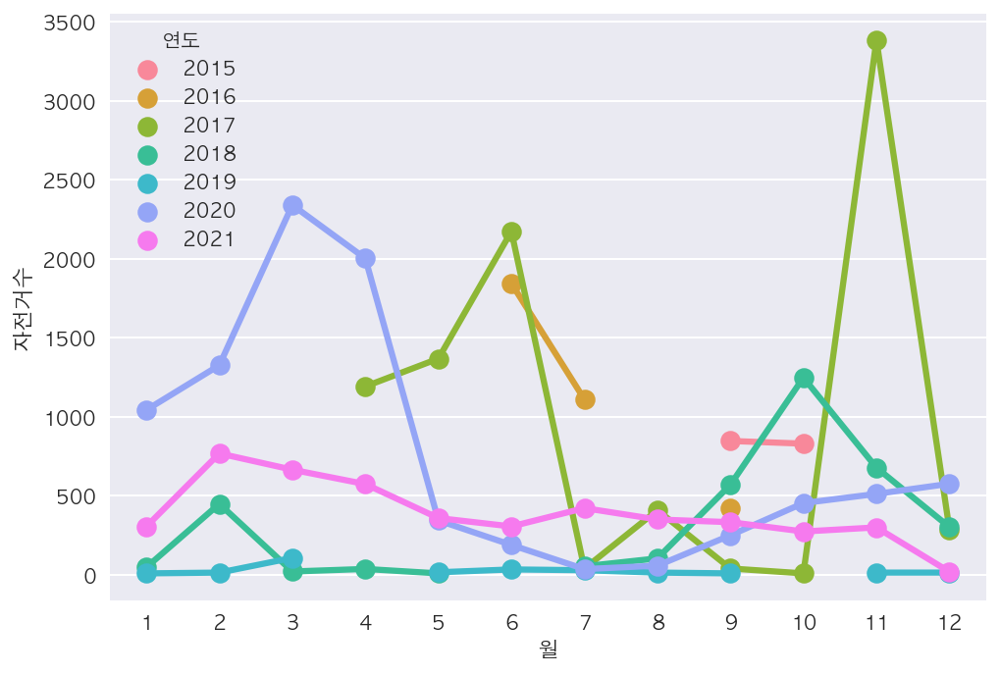

In [61]:
# pointplot x="월", y="자전거수", hue="연도"
sns.pointplot(data=df, x="월", y="자전거수", hue="연도", ci=None, estimator=np.sum)

Text(0.5, 1.0, '연도별 대여소별 평균 자전거 설치수')

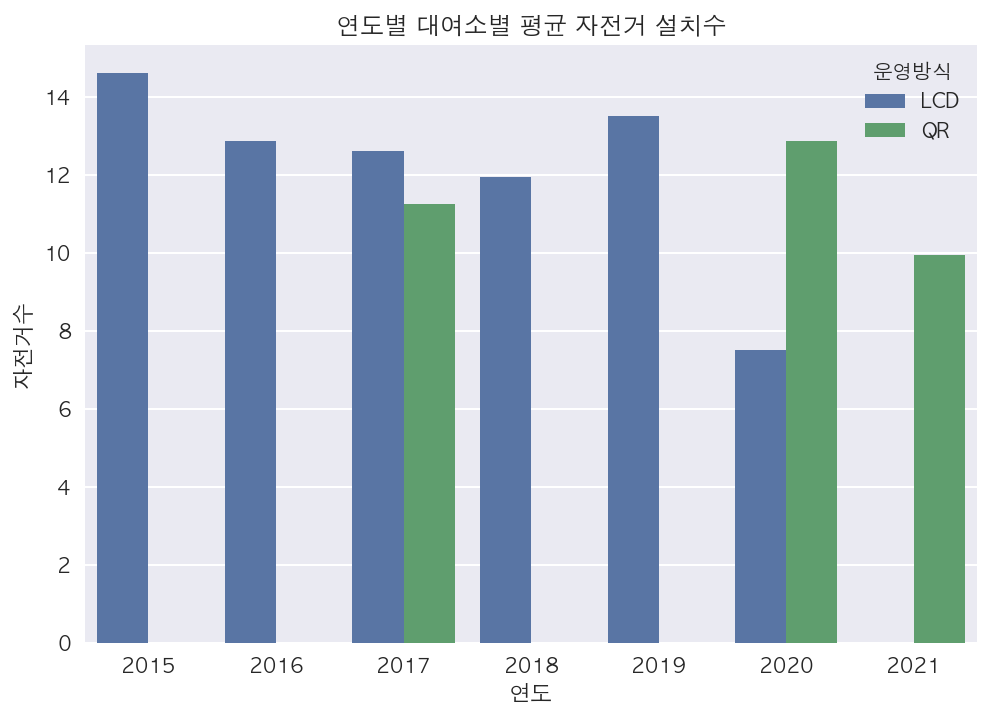

In [62]:
# barplot x="연도", y="자전거수", hue="운영방식"
sns.barplot(data=df, x="연도", y="자전거수", hue="운영방식", ci=None
           ).set_title("연도별 대여소별 평균 자전거 설치수")

Text(0.5, 1.0, '연도별 대여소별 평균 자전거 설치수')

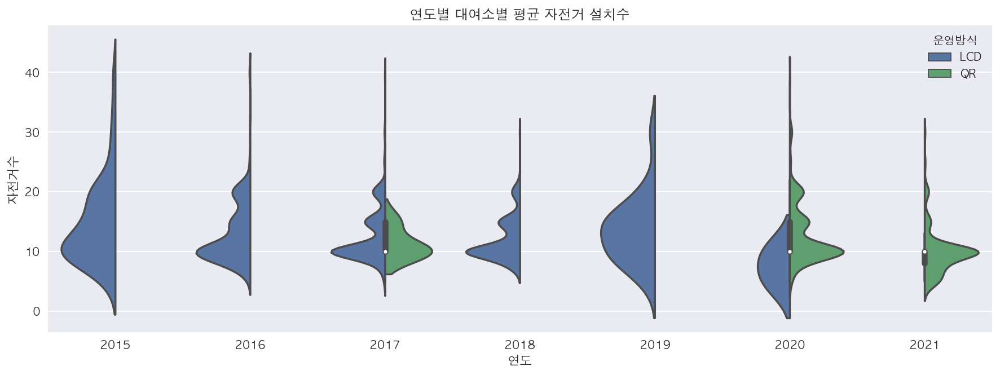

In [63]:
# violinplot x="연도", y="자전거수", hue="운영방식"
plt.figure(figsize=(15, 5))

sns.violinplot(data=df, x="연도", y="자전거수", hue="운영방식", split=True
           ).set_title("연도별 대여소별 평균 자전거 설치수")

Text(0.5, 1.0, '연도별 대여소별 합계 자전거 설치수')

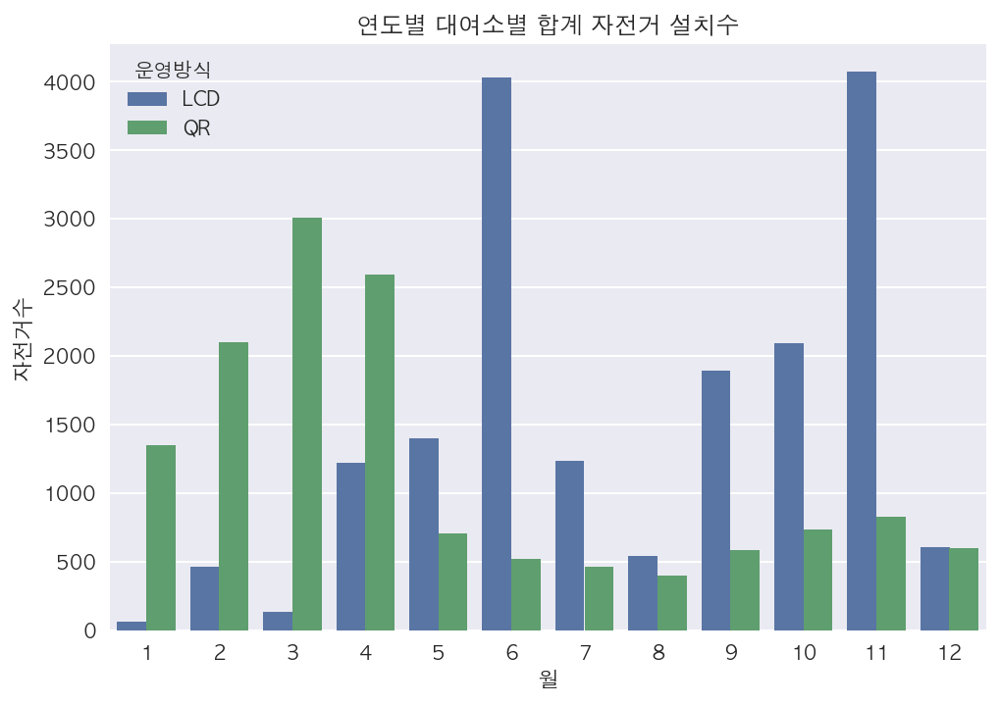

In [64]:
# barplot x="월", y="자전거수", hue="운영방식" 합계

sns.barplot(data=df, x="월", y="자전거수", hue="운영방식", ci=None, estimator=np.sum
           ).set_title("연도별 대여소별 합계 자전거 설치수")

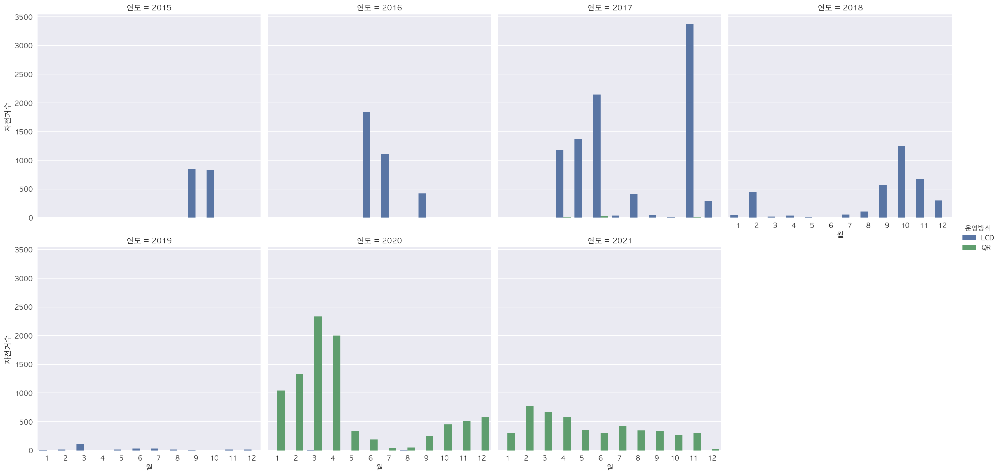

In [65]:
# catplot x="월", y="자전거수", hue="운영방식" 을 연도별로 시각화 합니다.
sns.catplot(data=df, x="월", y="자전거수", hue="운영방식", 
            col="연도", col_wrap=4,
            kind="bar", 
            ci=None, estimator=np.sum)

## 대여소 지도 시각화

## Folium 으로 지도 활용하기
* 다음의 프롬프트 창을 열어 conda 명령어로 설치합니다.
<img src="https://i.imgur.com/x7pzfCP.jpg">
* <font color="red">주피터 노트북 상에서 설치가 되지 않으니</font> anaconda prompt 를 열어서 설치해 주세요.


* 윈도우
    * <font color="red">관리자 권한</font>으로 아나콘다를 설치하셨다면 다음의 방법으로 anaconda prompt 를 열어 주세요.
    <img src="https://i.imgur.com/GhoLwsd.png">
* 맥
    * terminal 프로그램을 열어 설치해 주세요. 


* 다음의 문서를 활용해서 지도를 표현합니다.
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/main/examples/Quickstart.ipynb
* Folium 사용예제 :
http://nbviewer.jupyter.org/github/python-visualization/folium/tree/main/examples/

In [66]:
# 아나콘다에서 folium 을 사용하기 위해서는 별도의 설치가 필요
# https://anaconda.org/conda-forge/folium
# conda install -c conda-forge folium 
# 지도 시각화를 위한 라이브러리

import folium

In [67]:
# 지도의 중심을 지정하기 위해 위도와 경도의 평균을 구합니다. 
# lat, long
lat = df["위도"].mean()
long = df["경도"].mean()
lat, long

(37.54723017686778, 126.99171024973694)

### 반복문과 조건문으로 대여소를 지도에 표시하기

In [68]:
df.head()

,대여소번호,대여소명,자치구,상세주소,위도,경도,설치시기,LCD,QR,운영방식,자전거수,연도,월,일,요일
0,102.0,망원역 1번출구 앞,마포구,서울특별시 마포구 월드컵로 72,37.555649,126.910629,2015-09-06 23:42:06.000,20.0,NaN,LCD,20,2015,9,6,6
1,103.0,망원역 2번출구 앞,마포구,서울특별시 마포구 월드컵로 79,37.554951,126.910835,2015-09-06 23:43:13.000,14.0,NaN,LCD,14,2015,9,6,6
2,104.0,합정역 1번출구 앞,마포구,서울특별시 마포구 양화로 59,37.550629,126.914986,2015-09-06 23:44:31.000,13.0,NaN,LCD,13,2015,9,6,6
3,105.0,합정역 5번출구 앞,마포구,서울특별시 마포구 양화로 48,37.550007,126.914825,2015-09-06 23:45:30.000,5.0,NaN,LCD,5,2015,9,6,6
4,106.0,합정역 7번출구 앞,마포구,서울특별시 마포구 독막로 4,37.548645,126.912827,2015-09-06 23:46:31.000,10.0,NaN,LCD,10,2015,9,6,6


In [69]:
df.loc[0, "위도"]

37.5556488

In [70]:
df.loc[0, "경도"]

126.91062927

In [71]:
df.columns

Index(['대여소번호', '대여소명', '자치구', '상세주소', '위도', '경도', '설치시기', 'LCD', 'QR', '운영방식',
       '자전거수', '연도', '월', '일', '요일'],
      dtype='object')

In [72]:
# CircleMarker 로 대여소를 표시합니다.
# tiles="Stamen Toner"
# 운영방식에 따라 원 색상을 다르게 표시합니다.
fm = folium.Map(location=[lat, long],  zoom_start=11)

for row in df.index:
    rent_color_val = df.loc[row, "운영방식"]
    if rent_color_val == "QR":
        rent_color = "green"
    else:
        rent_color = "blue"
    folium.CircleMarker(location=[df.loc[row, "위도"], df.loc[row, "경도"]], 
                        tooltip=df.loc[row, "대여소명"] + " - "+ df.loc[row, "상세주소"] ,
                        color=rent_color, fill_color=rent_color, fill=True,
                        radius=3).add_to(fm)
fm

### choropleth 를 위한 GeoJSON 파일로드

* 구별로 대여소수를 표현하기 위해 GeoJSON 파일 로드
    * 파일출처 : [southkorea/seoul-maps: Seoul administrative divisions in ESRI Shapefile, GeoJSON and TopoJSON formats.](https://github.com/southkorea/seoul-maps)
    * 이 링크에서도 다운로드가 가능합니다. https://drive.google.com/open?id=13j8-_XLdPe0pptsqu8-uyE-0Ym6V2jw5
    
* Choropleth-maps : https://python-visualization.github.io/folium/quickstart.html#Choropleth-maps


* 공식문서 예제

```python
import pandas as pd

url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)
state_geo = f"{url}/us-states.json"
state_unemployment = f"{url}/US_Unemployment_Oct2012.csv"
state_data = pd.read_csv(state_unemployment)

m = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=state_data,
    columns=["State", "Unemployment"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Unemployment Rate (%)",
).add_to(m)

folium.LayerControl().add_to(m)

m
```

In [73]:
# 서울의 행정구역 경계를 GeoJSON으로 표현한 파일입니다. 
# 이 파일을 불러와 구별 대여소수를 표현합니다.
geo_path = 'data/seoul_municipalities_geo_simple.json'
print(geo_path)


import json
geo_json = json.load(open(geo_path, encoding="utf-8"))

data/seoul_municipalities_geo_simple.json


In [74]:
# features, properties 정보 보기
geo_json["features"][0]["properties"]

{'SIG_CD': '11320',
 'SIG_KOR_NM': '도봉구',
 'SIG_ENG_NM': 'Dobong-gu',
 'ESRI_PK': 0,
 'SHAPE_AREA': 0.00211,
 'SHAPE_LEN': 0.239901}

In [75]:
# features, properties, SIG_KOR_NM 정보 보기
geo_json["features"][0]["properties"]["SIG_KOR_NM"]

'도봉구'

In [76]:
# 자치구별 자전거수 합계 groupby 로 구하기
df_gu_bike_sum = df.groupby("자치구")["자전거수"].sum().sort_values()
df_gu_bike_sum = df_gu_bike_sum.reset_index()
df_gu_bike_sum.head()

,자치구,자전거수
0,강북구,649
1,도봉구,775
2,금천구,856
3,관악구,901
4,동작구,916


In [77]:
# choropleth의 색상은 fill_color = 'YlGn'을 사용합니다.
# name='choropleth'
# columns=['자치구', '자전거수'],
# key_on='feature.properties.SIG_KOR_NM'

m = folium.Map(location=[lat, long], zoom_start=11)

folium.Choropleth(
    geo_data=geo_path,
    name="choropleth",
    data=df_gu_bike_sum,
    columns=["자치구", "자전거수"],
    key_on="feature.properties.SIG_KOR_NM",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="자전거수",
).add_to(m)

folium.LayerControl().add_to(m)

m

In [78]:
# choropleth의 색상은 fill_color = 'YlGn'을 사용합니다.
# tiles="Stamen Toner"

m = folium.Map(location=[lat, long], zoom_start=11, tiles="Stamen Toner")

folium.Choropleth(
    geo_data=geo_path,
    name="choropleth",
    data=df_gu_bike_sum,
    columns=["자치구", "자전거수"],
    key_on="feature.properties.SIG_KOR_NM",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="자전거수",
).add_to(m)

folium.LayerControl().add_to(m)

for row in df.index:
    rent_color_val = df.loc[row, "운영방식"]
    if rent_color_val == "QR":
        rent_color = "green"
    else:
        rent_color = "blue"
    folium.CircleMarker(location=[df.loc[row, "위도"], df.loc[row, "경도"]], 
                        tooltip=df.loc[row, "대여소명"] + " - "+ df.loc[row, "상세주소"] ,
                        color=rent_color, fill_color=rent_color, fill=True,
                        radius=3).add_to(m)
    
m